# Visualizing Data by Segment of Footprint

In [1]:
import warnings
warnings.filterwarnings("ignore") # suppress warnings

In [2]:
import os
import sys
import h5py
import laspy
import pyproj
import datetime 
import numpy as np
import pandas as pd
import geopandas as gpd
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from shapely.geometry import Polygon
from sklearn.neighbors import NearestNeighbors

plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

# SciPy for exact p-values / critical t
try:
    from scipy import stats
    _HAS_SCIPY = True
except Exception:
    _HAS_SCIPY = False

In [3]:
function_path = os.path.expanduser("~/geoscience/carbon_estimation/code/functions")
sys.path.append(function_path)

# Check the default PROJ data directory
print(pyproj.datadir.get_data_dir())

/bsuscratch/tnde/miniforge3/envs/veg_height/share/proj


## Loading ICESat2 Data

In [4]:
# from helper_functions import load_icesat2_data
# projected_crs = "epsg:6340" 
# icesat2_file = "icesat2_ml2.geojson"
# icesat2_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/"
# atl08 = icesat2_dir+f'{icesat2_file}'
# atl08

In [5]:
# %%time
# icesat2_gdf_atl08 = load_icesat2_data(atl08, "ATL08", process = False)
# icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["gnd_ph_count"] != 0]
# icesat2_gdf_atl08 = icesat2_gdf_atl08[icesat2_gdf_atl08["h_mean_canopy"] <= 15]
# icesat2_gdf_atl08_ground = icesat2_gdf_atl08.rename(columns={"elevation_NAVD88_icesat2_from_crs": "Elevation"})
# icesat2_gdf_atl08_non_ground = icesat2_gdf_atl08_ground.copy()
# icesat2_gdf_atl08_non_ground["Elevation"] = icesat2_gdf_atl08_non_ground["Elevation"]+icesat2_gdf_atl08_non_ground["h_mean_canopy"]
# icesat2_gdf_atl08_non_ground = icesat2_gdf_atl08_non_ground[icesat2_gdf_atl08_non_ground["h_mean_canopy"]>0]
# print(f"Length of data: {len(icesat2_gdf_atl08)}")
# print(icesat2_gdf_atl08.crs, "\n")
# icesat2_gdf_atl08.crs

In [6]:
# icesat2_gdf_atl08.columns

In [7]:
icesat2_dir_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/rcew_icesat2_atl08_all_xyz_ground.csv"
icesat2_dir_non_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/rcew_icesat2_atl08_all_xyz_non_ground_only.csv"
icesat2_gdf_atl08_ground = pd.read_csv(icesat2_dir_ground)
icesat2_gdf_atl08_non_ground = pd.read_csv(icesat2_dir_non_ground)

icesat2_gdf_atl08_ground = icesat2_gdf_atl08_ground.rename(columns={"X": "Easting", "Y": "Northing", "Z": "Elevation"})
icesat2_gdf_atl08_non_ground = icesat2_gdf_atl08_ground.rename(columns={"X": "Easting", "Y": "Northing", "Z_non_ground": "Elevation"})

# icesat2_gdf_atl08_ground = icesat2_gdf_atl08_ground[icesat2_gdf_atl08_ground["h_mean_canopy"] <= 15]
# icesat2_gdf_atl08_non_ground = icesat2_gdf_atl08_non_ground[icesat2_gdf_atl08_non_ground["h_mean_canopy"] <= 15]

## Loading GEDI Data

In [8]:
# drop_cols = ["shot_number", "Latitude_l2a", "Longitude_l2a", 
#              "rh_85", "rh_90", "rh_98", "rh_99", "GEDI02_A_slope_ratio_utm", 
#              "GEDI02_A_slope_rise_run", "cover_z_10", "cover_z_15", "cover_z_20", 
#              "cover_z_25", "cover_z_27", "cover_z_28", "pai_z_10", "pai_z_15", 
#              "pai_z_20", "pai_z_25", "pai_z_27", "pai_z_28", "pavd_z_10", 
#              "pavd_z_15", "pavd_z_20", "pavd_z_25", "pavd_z_27", "pavd_z_28", "rh100", "geometry"]

In [9]:
# target_col = "rh_100" # "rh_80"
# gedi_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/gedi_data/gedi_finder/ml_data/"
# gedi_file = "gedi_ml2.geojson"
# gedi_data = gpd.read_file(os.path.join(gedi_dir, gedi_file))
# gedi_data = gedi_data.drop(drop_cols, axis = 1)
# gedi_data = gedi_data[gedi_data["fhd_normal"] != -9999.000000]
# gedi_data = gedi_data[gedi_data[target_col] <= 15]
# gedi_data_ground = gedi_data.rename(columns={"Easting_l2a": "Easting", "Northing_l2a": "Northing", "BEAM_l2a": "BEAM", "elevation_NAVD88_gedi_from_crs_l2a": "Elevation"})
# gedi_data_non_ground = gedi_data_ground.copy()
# gedi_data_non_ground["Elevation"] = gedi_data_non_ground["Elevation"]+gedi_data_non_ground["rh_100"]
# gedi_data_non_ground = gedi_data_non_ground[gedi_data_non_ground["rh_100"]>0]


In [10]:
gedi_dir_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/gedi_xyz_transform_l2a.csv"
gedi_dir_non_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/gedi_xyz_transform_l2a_non_ground_only_final.csv"

gedi_data_ground = pd.read_csv(gedi_dir_ground)
gedi_data_non_ground = pd.read_csv(gedi_dir_non_ground)

gedi_data_ground = gedi_data_ground.rename(columns={"elevation_NAVD88_gedi_from_crs": "Elevation"})
gedi_data_non_ground = gedi_data_non_ground.rename(columns={"Easting_l2a": "Easting", "Northing_l2a": "Northing", "elevation_non_ground": "Elevation"})

# gedi_data_ground = gedi_data_ground[gedi_data_ground["rh_100"] <= 15]
# gedi_data_non_ground = gedi_data_non_ground[gedi_data_non_ground["rh_100"] <= 15]

## Nearest Neighbour Data Points, T-Test, and Plotting Functions.

In [11]:
def _nearest_pairs(df1, dfX, xcol="Easting", ycol="Northing", max_dist=None):
    """
    Nearest-neighbor join: for each point in dfX, find the closest point in df1.
    Returns a DataFrame where each row is a matched pair with suffixes _df1 and _dfX.
    If max_dist (same units as coords) is given, pairs farther than this are dropped.
    """
    if dfX.empty or df1.empty:
        return pd.DataFrame()

    nbrs = NearestNeighbors(n_neighbors=1, algorithm="kd_tree")
    nbrs.fit(df1[[xcol, ycol]].to_numpy())

    distances, indices = nbrs.kneighbors(dfX[[xcol, ycol]].to_numpy(), return_distance=True)
    distances = distances.ravel()
    indices = indices.ravel()

    keep = np.ones_like(distances, dtype=bool)
    if max_dist is not None:
        keep = distances <= max_dist
    if not keep.any():
        return pd.DataFrame()

    left = df1.iloc[indices[keep]].reset_index(drop=True).add_suffix("_df1")
    right = dfX.iloc[np.where(keep)[0]].reset_index(drop=True).add_suffix("_dfX")
    out = pd.concat([left, right], axis=1)
    out["nn_distance"] = distances[keep]
    return out


def _ind_ttest_from_pairs(pairs, elev_col="Elevation", label="df1 vs dfX", equal_var=False):
    """
    Runs an INDEPENDENT two-sample t-test on elevation using the matched subset,
    treating the two samples as independent (not paired).
      - Welch's t-test by default (equal_var=False).
      - If SciPy is not available, prints t-stat and dof; p/CI = NaN.

    Uses columns: {elev_col}_df1 and {elev_col}_dfX from `pairs`.
    """
    c1 = f"{elev_col}_df1"
    cX = f"{elev_col}_dfX"
    if c1 not in pairs or cX not in pairs:
        print(f"[{label}] Missing columns '{c1}' / '{cX}'. Set elev_col correctly.")
        return

    a = pairs[c1].to_numpy(dtype=float)
    b = pairs[cX].to_numpy(dtype=float)
    mask = np.isfinite(a) & np.isfinite(b)
    a, b = a[mask], b[mask]
    n1, n2 = len(a), len(b)
    if n1 < 2 or n2 < 2:
        print(f"[{label}] Not enough data for independent t-test (n1={n1}, n2={n2}).")
        return

    mean1, mean2 = a.mean(), b.mean()
    var1, var2 = a.var(ddof=1), b.var(ddof=1)
    diff = mean1 - mean2

    if _HAS_SCIPY:
        t_stat, p_val = stats.ttest_ind(a, b, equal_var=equal_var, nan_policy="omit")
        if equal_var:
            dof = n1 + n2 - 2
            sp2 = ((n1 - 1) * var1 + (n2 - 1) * var2) / dof
            se = np.sqrt(sp2 * (1/n1 + 1/n2))
        else:
            se = np.sqrt(var1 / n1 + var2 / n2)
            dof_num = (var1 / n1 + var2 / n2) ** 2
            dof_den = (var1**2 / (n1**2 * (n1 - 1))) + (var2**2 / (n2**2 * (n2 - 1)))
            dof = dof_num / dof_den
        tcrit = stats.t.ppf(0.975, dof)
        ci_lo, ci_hi = diff - tcrit * se, diff + tcrit * se
    else:
        # Manual Welch or pooled t (without p-values / CI)
        if equal_var:
            dof = n1 + n2 - 2
            sp2 = ((n1 - 1) * var1 + (n2 - 1) * var2) / dof
            se = np.sqrt(sp2 * (1/n1 + 1/n2))
        else:
            se = np.sqrt(var1 / n1 + var2 / n2)
            dof_num = (var1 / n1 + var2 / n2) ** 2
            dof_den = (var1**2 / (n1**2 * (n1 - 1))) + (var2**2 / (n2**2 * (n2 - 1)))
            dof = dof_num / dof_den
        t_stat = diff / se if se > 0 else np.nan
        p_val = np.nan
        ci_lo = ci_hi = np.nan

    method = "Student (equal variances)" if equal_var else "Welch (unequal variances)"
    print(f"\nIndependent t-test [{label}] on '{elev_col}' — {method}")
    print(f"  n1 = {n1}, n2 = {n2}, dof ≈ {dof:.4g}")
    print(f"  mean(df1) = {mean1:.6g}, mean(dfX) = {mean2:.6g}")
    print(f"  difference (df1 - dfX) = {diff:.6g}")
    print(f"  t = {t_stat:.6g}, p = {p_val:.6g}")
    print(f"  95% CI (diff): [{ci_lo:.6g}, {ci_hi:.6g}]")

def pair_and_plot_indttest(
    df1, df2, df3,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=None, plot=True, connect_pairs=True, equal_var=False, 
    bbox = None # provide bbox as a list in the format [minx, miny, maxx, maxy]
):
    """
    1) Compute df1 bounding box.
    2) Filter df2/df3 to that box.
    3) Build nearest pairs (df1 <--> df2) and (df1 <--> df3).
    4) Run INDEPENDENT two-sample t-tests on 'elev_col' for both sets and print results.
    5) Plot ONLY the paired points within the bbox (optionally draw connectors).

    Returns: pairs12, pairs13
    """
    if bbox is not None:
        x_min, y_min, x_max, y_max = bbox
    else:
        # Bounding box from df1
        x_min, x_max = df1[xcol].min(), df1[xcol].max()
        y_min, y_max = df1[ycol].min(), df1[ycol].max()

    # Filter df2/df3 to bbox
    df2_f = df2[(df2[xcol] >= x_min) & (df2[xcol] <= x_max) &
                (df2[ycol] >= y_min) & (df2[ycol] <= y_max)].copy()
    df3_f = df3[(df3[xcol] >= x_min) & (df3[xcol] <= x_max) &
                (df3[ycol] >= y_min) & (df3[ycol] <= y_max)].copy()

    # Nearest pairs
    pairs12 = _nearest_pairs(df1, df2_f, xcol=xcol, ycol=ycol, max_dist=max_dist)
    pairs13 = _nearest_pairs(df1, df3_f, xcol=xcol, ycol=ycol, max_dist=max_dist)

    # Independent t-tests (Welch by default)
    if not pairs12.empty:
        _ind_ttest_from_pairs(pairs12, elev_col=elev_col, label="df1 vs df2", equal_var=equal_var)
    else:
        print("\nNo paired points found for df1 vs df2 inside the bounding box (or after max_dist filtering).")

    if not pairs13.empty:
        _ind_ttest_from_pairs(pairs13, elev_col=elev_col, label="df1 vs df3", equal_var=equal_var)
    else:
        print("No paired points found for df1 vs df3 inside the bounding box (or after max_dist filtering).")

    # Plot: ONLY the paired points (within bbox)
    if plot:
        plt.figure(figsize=(10, 6))

        # df1 (paired only)
        xs1 = pd.concat([
            pairs12.get(f"{xcol}_df1", pd.Series([], dtype=float)),
            pairs13.get(f"{xcol}_df1", pd.Series([], dtype=float)),
        ], ignore_index=True)
        ys1 = pd.concat([
            pairs12.get(f"{ycol}_df1", pd.Series([], dtype=float)),
            pairs13.get(f"{ycol}_df1", pd.Series([], dtype=float)),
        ], ignore_index=True)
        if len(xs1) > 0:
            plt.scatter(xs1, ys1, s=15, alpha=1.0, color="red", marker="s", label="LiDAR (paired only)")

        # df2 paired
        if not pairs12.empty:
            plt.scatter(pairs12[f"{xcol}_dfX"], pairs12[f"{ycol}_dfX"], s=5, alpha=0.9, color="black", label="ICESat-2 (paired)")

        # df3 paired
        if not pairs13.empty:
            plt.scatter(pairs13[f"{xcol}_dfX"], pairs13[f"{ycol}_dfX"], s=5, alpha=0.9, color="blue", label="GEDI (paired)")

        # connectors
        if connect_pairs and not pairs12.empty:
            for i in range(len(pairs12)):
                plt.plot(
                    [pairs12[f"{xcol}_df1"].iat[i], pairs12[f"{xcol}_dfX"].iat[i]],
                    [pairs12[f"{ycol}_df1"].iat[i], pairs12[f"{ycol}_dfX"].iat[i]],
                    linewidth=0.6, alpha=0.25, color="magenta"
                )
        if connect_pairs and not pairs13.empty:
            for i in range(len(pairs13)):
                plt.plot(
                    [pairs13[f"{xcol}_df1"].iat[i], pairs13[f"{xcol}_dfX"].iat[i]],
                    [pairs13[f"{ycol}_df1"].iat[i], pairs13[f"{ycol}_dfX"].iat[i]],
                    linewidth=0.6, alpha=0.25, color="magenta"
                )

        # Bounding box outline (for context)
        plt.plot([x_min, x_max, x_max, x_min, x_min],
                 [y_min, y_min, y_max, y_max, y_min],
                 linestyle="--", color="black", 
                 label="Bounding box")

        plt.xlabel(xcol)
        plt.ylabel(ycol)
        plt.title("Paired points only (within df1 bounding box)")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return pairs12, pairs13

# max_dist = 5
max_dist = None
equal_var = True

## Flat Tile, Has No Vegetation

### Ground Truth Data

In [12]:
%%time
# Specify the path to .laz file
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH190820.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "return_number": np.array(laz_data.return_number),
    "classification": laz_data.classification,
    "user_data": laz_data.user_data,
    "point_source_id": laz_data.point_source_id,
    "gps_time": laz_data.gps_time,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})

data_airbone_lidar = data_airbone_lidar[data_airbone_lidar["classification"].isin([1, 2, 3, 4, 5])]#.iloc[:1000000, :]
data_airbone_lidar = data_airbone_lidar[(data_airbone_lidar["scan_angle"] >= -3000) & (data_airbone_lidar["scan_angle"] <= 3000)]
data_airbone_lidar_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 2]
data_airbone_lidar_non_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 1]
# display(data_airbone_lidar.head())
# display(len(data_airbone_lidar))

CPU times: user 8.95 s, sys: 816 ms, total: 9.76 s
Wall time: 5.24 s


### Independent T-Test: Ground Points


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 89, n2 = 89, dof ≈ 176
  mean(df1) = 1216.03, mean(dfX) = 1215.99
  difference (df1 - dfX) = 0.0398015
  t = 0.0259423, p = 0.979333
  95% CI (diff): [-2.98806, 3.06767]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 205, n2 = 205, dof ≈ 408
  mean(df1) = 1217.2, mean(dfX) = 1217.25
  difference (df1 - dfX) = -0.0515251
  t = -0.0402209, p = 0.967937
  95% CI (diff): [-2.56981, 2.46676]


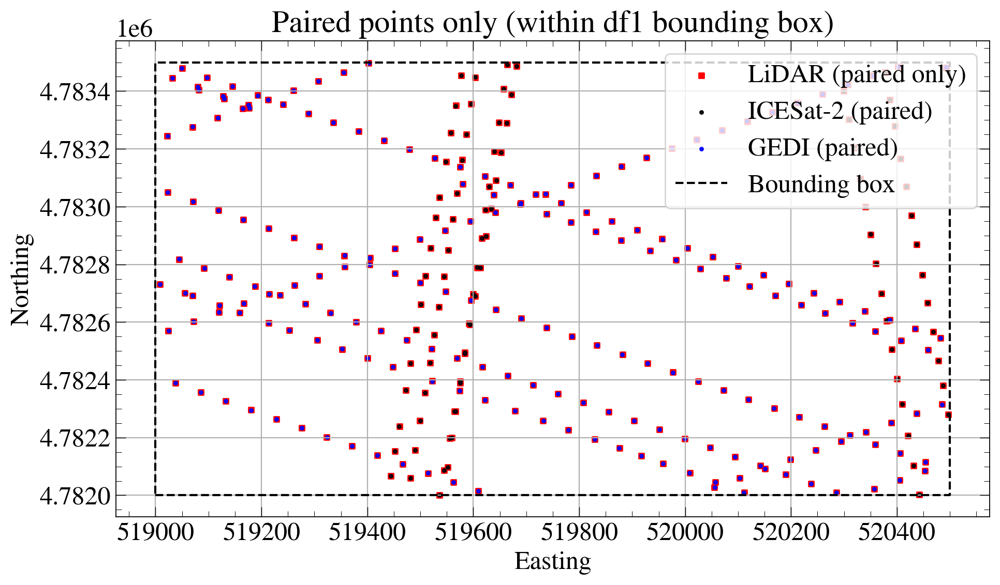

In [13]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_ground, icesat2_gdf_atl08_ground, gedi_data_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)


### Independent T-Test: Non-Ground Points

In [14]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_non_ground, icesat2_gdf_atl08_non_ground, gedi_data_non_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=False, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)



Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 89, n2 = 89, dof ≈ 176
  mean(df1) = 1216.38, mean(dfX) = 1215.99
  difference (df1 - dfX) = 0.394408
  t = 0.255059, p = 0.798975
  95% CI (diff): [-2.65734, 3.44616]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 168, n2 = 168, dof ≈ 334
  mean(df1) = 1217.84, mean(dfX) = 1222.72
  difference (df1 - dfX) = -4.88635
  t = -3.15381, p = 0.00175784
  95% CI (diff): [-7.93407, -1.83864]


## Flat Tile, Has Vegetation

### Ground Truth Data

In [15]:
%%time
# Specify the path to .laz file
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH160775.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "return_number": np.array(laz_data.return_number),
    "classification": laz_data.classification,
    "user_data": laz_data.user_data,
    "point_source_id": laz_data.point_source_id,
    "gps_time": laz_data.gps_time,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})
data_airbone_lidar = data_airbone_lidar[data_airbone_lidar["classification"].isin([1, 2, 3, 4, 5])]#.iloc[:1000000, :]
data_airbone_lidar = data_airbone_lidar[(data_airbone_lidar["scan_angle"] >= -3000) & (data_airbone_lidar["scan_angle"] <= 3000)]
data_airbone_lidar_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 2]
data_airbone_lidar_non_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 1]
# display(data_airbone_lidar.head())
# display(len(data_airbone_lidar))

CPU times: user 14 s, sys: 1.21 s, total: 15.2 s
Wall time: 7.99 s


### Independent T-Test: Ground Points


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 315, n2 = 315, dof ≈ 628
  mean(df1) = 1717.77, mean(dfX) = 1650.64
  difference (df1 - dfX) = 67.1226
  t = 3.57619, p = 0.000375453
  95% CI (diff): [30.2644, 103.981]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 211, n2 = 211, dof ≈ 420
  mean(df1) = 1765.59, mean(dfX) = 1766.59
  difference (df1 - dfX) = -1.00487
  t = -0.247306, p = 0.804792
  95% CI (diff): [-8.99177, 6.98202]


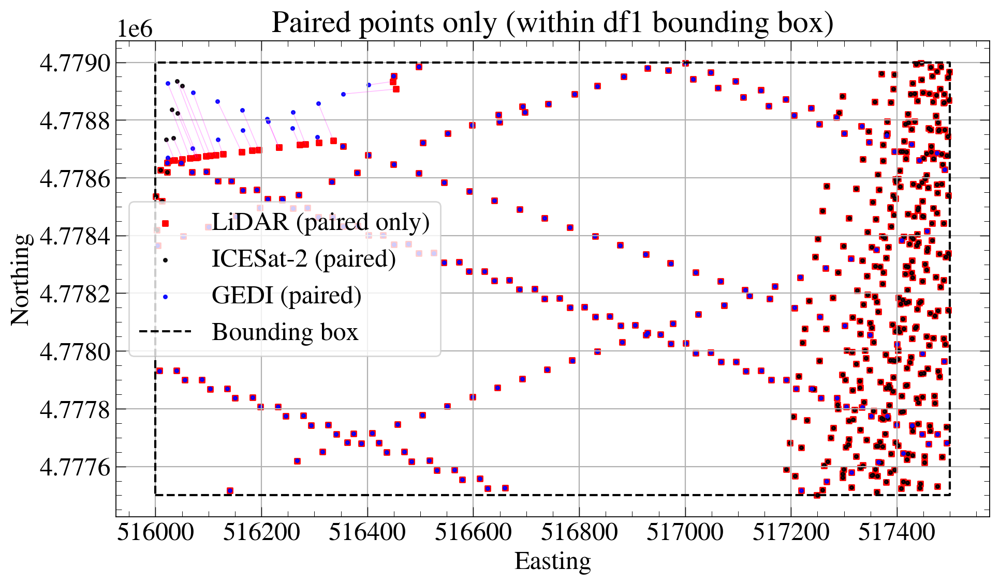

In [16]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_ground, icesat2_gdf_atl08_ground, gedi_data_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)


### Independent T-Test: Non-Ground Points

In [17]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_non_ground, icesat2_gdf_atl08_non_ground, gedi_data_non_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=False, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)



Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 315, n2 = 315, dof ≈ 628
  mean(df1) = 1718.46, mean(dfX) = 1650.64
  difference (df1 - dfX) = 67.8176
  t = 3.61288, p = 0.000327032
  95% CI (diff): [30.956, 104.679]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 181, n2 = 181, dof ≈ 360
  mean(df1) = 1763.29, mean(dfX) = 1769.77
  difference (df1 - dfX) = -6.47584
  t = -1.43991, p = 0.150761
  95% CI (diff): [-15.3203, 2.3686]


## Not Flat Tile, Has No Vegetation

### Ground Truth Data

In [18]:
%%time
# Specify the path to .laz file
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH190760.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "return_number": np.array(laz_data.return_number),
    "classification": laz_data.classification,
    "user_data": laz_data.user_data,
    "point_source_id": laz_data.point_source_id,
    "gps_time": laz_data.gps_time,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})
data_airbone_lidar = data_airbone_lidar[data_airbone_lidar["classification"].isin([1, 2, 3, 4, 5])]#.iloc[:1000000, :]
data_airbone_lidar = data_airbone_lidar[(data_airbone_lidar["scan_angle"] >= -3000) & (data_airbone_lidar["scan_angle"] <= 3000)]
data_airbone_lidar_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 2]
data_airbone_lidar_non_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 1]
display(data_airbone_lidar.head())
display(len(data_airbone_lidar))

,Easting,Northing,Elevation,intensity,return_number,classification,user_data,point_source_id,gps_time,scan_angle,number_of_returns
1,520254.72,4776250.89,1541.82,3840,1,1,0,3011,2.747227e+08,2833,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
6,520364.84,4776272.21,1574.81,2000,1,1,0,3011,2.747227e+08,3000,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
22,520401.19,4776314.18,1565.53,4048,1,2,0,3011,2.747227e+08,3000,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
24,520394.54,4776300.95,1569.85,3552,1,2,0,3011,2.747227e+08,3000,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
25,520288.05,4776250.91,1550.08,2352,1,1,0,3011,2.747227e+08,3000,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."


17858991

CPU times: user 19 s, sys: 1.68 s, total: 20.6 s
Wall time: 10.9 s


### Independent T-Test: Ground Points


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 216, n2 = 216, dof ≈ 430
  mean(df1) = 1530.77, mean(dfX) = 1480.55
  difference (df1 - dfX) = 50.226
  t = 2.69411, p = 0.00733403
  95% CI (diff): [13.5834, 86.8687]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 195, n2 = 195, dof ≈ 388
  mean(df1) = 1465.99, mean(dfX) = 1466.77
  difference (df1 - dfX) = -0.778578
  t = -0.162651, p = 0.870878
  95% CI (diff): [-10.1899, 8.63272]


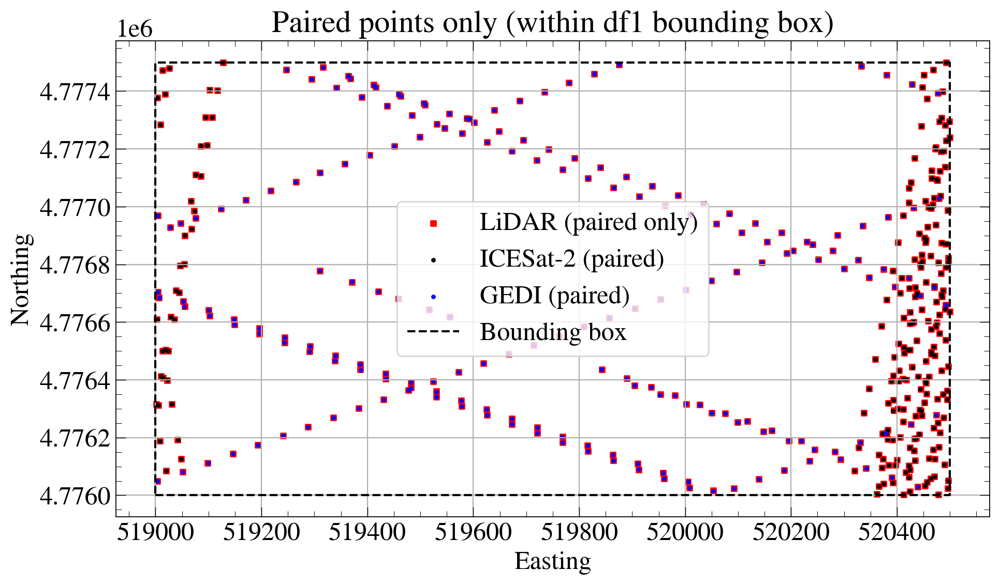

In [19]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_ground, icesat2_gdf_atl08_ground, gedi_data_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)


### Independent T-Test: Non-Ground Points

In [20]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_non_ground, icesat2_gdf_atl08_non_ground, gedi_data_non_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=False, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)



Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 216, n2 = 216, dof ≈ 430
  mean(df1) = 1530.99, mean(dfX) = 1480.55
  difference (df1 - dfX) = 50.4453
  t = 2.70606, p = 0.00707946
  95% CI (diff): [13.8053, 87.0852]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 175, n2 = 175, dof ≈ 348
  mean(df1) = 1466.43, mean(dfX) = 1474
  difference (df1 - dfX) = -7.57601
  t = -1.47584, p = 0.140891
  95% CI (diff): [-17.6723, 2.5203]


## Not Flat Tile, Has Vegetation

### Ground Truth Data

In [21]:
%%time
# Specify the path to .laz file
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "classification": laz_data.classification,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})

CPU times: user 18.8 s, sys: 742 ms, total: 19.5 s
Wall time: 6.29 s


In [22]:
%%time
# Specify the path to .laz file
# laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH160685.laz"
laz_file_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.laz"

# Load the .laz file
laz_data = laspy.read(laz_file_path)

data_airbone_lidar = pd.DataFrame({
    "Easting": np.array(laz_data.x),
    "Northing": np.array(laz_data.y),
    "Elevation": np.array(laz_data.z),
    "intensity": laz_data.intensity,
    "return_number": np.array(laz_data.return_number),
    "classification": laz_data.classification,
    "user_data": laz_data.user_data,
    "point_source_id": laz_data.point_source_id,
    "gps_time": laz_data.gps_time,
    "scan_angle": laz_data.scan_angle,
    "number_of_returns": laz_data.number_of_returns
})
data_airbone_lidar = data_airbone_lidar[data_airbone_lidar["classification"].isin([1, 2, 3, 4, 5])]#.iloc[:1000000, :]
data_airbone_lidar = data_airbone_lidar[(data_airbone_lidar["scan_angle"] >= -3000) & (data_airbone_lidar["scan_angle"] <= 3000)]
data_airbone_lidar_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 2]
data_airbone_lidar_non_ground = data_airbone_lidar[data_airbone_lidar["classification"] == 1]
display(data_airbone_lidar.head())
display(len(data_airbone_lidar))

,Easting,Northing,Elevation,intensity,return_number,classification,user_data,point_source_id,gps_time,scan_angle,number_of_returns
0,518808.30,4770000.51,1889.20,1392,1,1,0,3021,2.747243e+08,2666,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
1,518896.10,4770008.70,1891.70,5616,1,2,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
2,518814.31,4770000.47,1886.49,4160,2,1,0,3021,2.747243e+08,2666,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
3,518893.13,4770022.72,1890.03,5488,1,2,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."
4,518894.76,4770012.79,1891.26,6144,1,1,0,3021,2.747243e+08,2833,"[2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, ..."


22608211

CPU times: user 25.2 s, sys: 2.07 s, total: 27.3 s
Wall time: 14 s


### Independent T-Test: Ground Points


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 70, n2 = 70, dof ≈ 138
  mean(df1) = 1765.29, mean(dfX) = 1539.02
  difference (df1 - dfX) = 226.268
  t = 3.13113, p = 0.00212614
  95% CI (diff): [83.3802, 369.156]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 89, n2 = 89, dof ≈ 176
  mean(df1) = 1731.89, mean(dfX) = 1735.18
  difference (df1 - dfX) = -3.28496
  t = -0.290357, p = 0.771885
  95% CI (diff): [-25.6126, 19.0427]


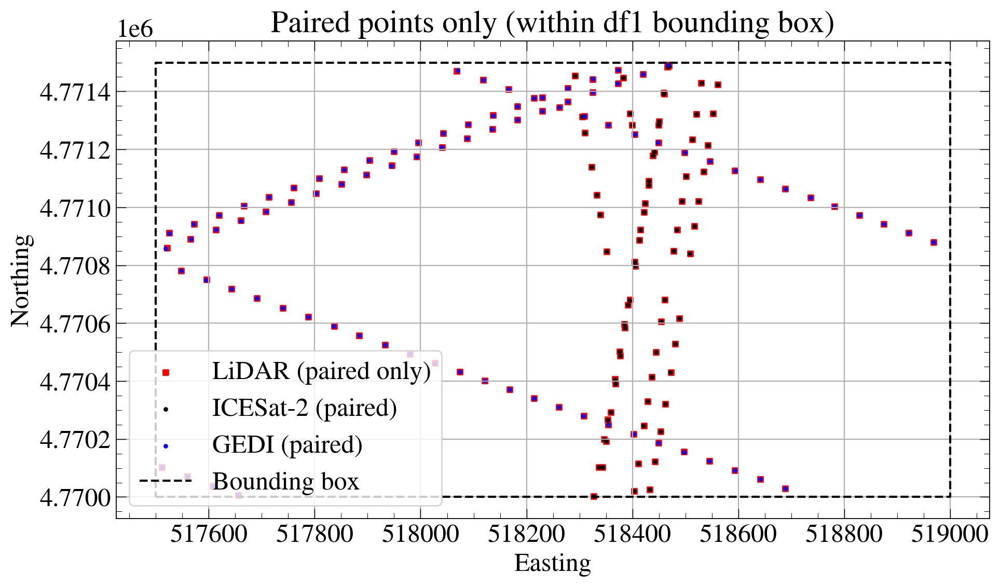

In [23]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_ground, icesat2_gdf_atl08_ground, gedi_data_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)


### Independent T-Test: Non-Ground Points

In [24]:
pairs_icesat2, pairs_gedi = pair_and_plot_indttest(
    data_airbone_lidar_non_ground, icesat2_gdf_atl08_non_ground, gedi_data_non_ground,
    xcol="Easting", ycol="Northing", elev_col="Elevation",
    max_dist=max_dist, plot=False, connect_pairs=True,
    equal_var=equal_var   # Welch by default; set True for Student's pooled t-test
)


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 70, n2 = 70, dof ≈ 138
  mean(df1) = 1767.01, mean(dfX) = 1539.02
  difference (df1 - dfX) = 227.989
  t = 3.15537, p = 0.0019681
  95% CI (diff): [85.1206, 370.858]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 82, n2 = 82, dof ≈ 162
  mean(df1) = 1739.75, mean(dfX) = 1750.73
  difference (df1 - dfX) = -10.974
  t = -0.91671, p = 0.360657
  95% CI (diff): [-34.6135, 12.6655]


In [25]:
# alpha = 0.05  # Significance level

# print(f"T-statistic: {t_statistic}")
# print(f"P-value: {p_value}")

# if p_value < alpha:
#     print("Reject the null hypothesis: There is a significant difference between the means of the two groups.")
# else:
#     print("Fail to reject the null hypothesis: There is no significant difference between the means of the two groups.")

### Out of Site Data Comparisons - Twin Falls

In [26]:
# path_035115 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH035115.laz" # top left
# path_035175 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH035175.laz" # top right
# path_110115 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH110115.laz" # bottom left
# path_110175 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH110175.laz" # bottom right
# corner_tiles = [path_035175, path_110175, path_035115, path_110115]
    
# minx = miny = float("inf")
# maxx = maxy = float("-inf")
# for p in path_list:
#     with laspy.open(p) as f:
#         hdr = f.header
#         # laspy v2 exposes scaled mins/maxs as arrays
#         try:
#             x_min, y_min = hdr.mins[0], hdr.mins[1]
#             x_max, y_max = hdr.maxs[0], hdr.maxs[1]
#         except AttributeError:
#             # Fallback for unusual/older installs
#             x_min, y_min = hdr.x_min, hdr.y_min
#             x_max, y_max = hdr.x_max, hdr.y_max

#         minx = min(minx, x_min)
#         miny = min(miny, y_min)
#         maxx = max(maxx, x_max)
#         maxy = max(maxy, y_max)
        
# minx, miny, maxx, maxy

In [27]:
def big_bbox_from_corner_laz(
    laz_paths,
    crs_epsg=None,                 # 6340 or 26911; 
    out_geojson=None,              # e.g., "big_bbox.geojson"
    out_shapefile=None             # e.g., "big_bbox.shp"
):
    """
    Given some LAZ files that sit at the corners of a larger area,
    compute the bounding box of the larger area by taking global min/max.

    Returns:
        bbox (minx, miny, maxx, maxy), GeoDataFrame with a single polygon.
    """
    laz_paths = [Path(p) for p in laz_paths]
    if not laz_paths:
        raise ValueError("Provide at least one LAZ path.")

    minx = miny = float("inf")
    maxx = maxy = float("-inf")

    for p in laz_paths:
        with laspy.open(p) as f:
            hdr = f.header
            # laspy v2 exposes scaled mins/maxs as arrays
            try:
                x_min, y_min = hdr.mins[0], hdr.mins[1]
                x_max, y_max = hdr.maxs[0], hdr.maxs[1]
            except AttributeError:
                # Fallback for unusual/older installs
                x_min, y_min = hdr.x_min, hdr.y_min
                x_max, y_max = hdr.x_max, hdr.y_max

            minx = min(minx, x_min)
            miny = min(miny, y_min)
            maxx = max(maxx, x_max)
            maxy = max(maxy, y_max)

    # Build polygon (ring in minx,miny -> minx,maxy -> maxx,maxy -> maxx,miny)
    poly = Polygon([(minx, miny), (minx, maxy), (maxx, maxy), (maxx, miny)])

    gdf = gpd.GeoDataFrame(
        [{"name": "big_bbox", "minx": minx, "miny": miny, "maxx": maxx, "maxy": maxy}],
        geometry=[poly],
        crs=f"EPSG:{crs_epsg}" if crs_epsg else None
    )

    # Save if needed
    if out_geojson:
        gdf.to_file(out_geojson, driver="GeoJSON")
    if out_shapefile:
        gdf.to_file(out_shapefile)

    # prints bbox
    print("\n== Big Bounding Box ==")
    print(f"(minx, miny, maxx, maxy): ({minx}, {miny}, {maxx}, {maxy})")

    # Upper-left/Lower-right style
    ulx, uly = minx, maxy
    lrx, lry = maxx, miny
    print("UpperLeftX, UpperLeftY, LowerRightX, LowerRightY:")
    print(f"{ulx}, {uly}, {lrx}, {lry}")
    # print("UpperLeftLat, UpperLeftLon, LowerRightLat, LowerRightLon:")
    # print(f"{uly}, {ulx}, {lry}, {lrx}")
    return (minx, miny, maxx, maxy), gdf

# LAZ files:
path_035115 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH035115.laz" # top left
path_035175 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH035175.laz" # top right
path_110115 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH110115.laz" # bottom left
path_110175 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls/USGS_LPC_ID_SouthernID_2018_D19_11TQH110175.laz" # bottom right
corner_tiles = [path_035175, path_110175, path_035115, path_110115]

# bbox
bbox, gdf = big_bbox_from_corner_laz(
    corner_tiles,
    crs_epsg=6340,                      
    out_geojson="big_bbox_twinfalls.geojson",     
    out_shapefile=None                 
)
print("\nbbox", bbox)
print("Done!!!")


== Big Bounding Box ==
(minx, miny, maxx, maxy): (703500.0, 4711500.0, 712499.99, 4718999.99)
UpperLeftX, UpperLeftY, LowerRightX, LowerRightY:
703500.0, 4718999.99, 712499.99, 4711500.0

bbox (703500.0, 4711500.0, 712499.99, 4718999.99)
Done!!!


ERROR 1: PROJ: proj_create_from_database: Open of /bsuscratch/tnde/miniforge3/envs/veg_height/share/proj failed


In [28]:
def laz_dir_to_df(
    laz_dir,
    keep=("x","y","z","intensity","classification","scan_angle","number_of_returns"),
    chunk_size=5_000_000,  # points per chunk
    crs_epsg=None          # 
):
    """
    Read all .laz files in laz_dir, select 'keep' attributes, and stack into one DataFrame.
    Returns (df, meta)
    """
    laz_paths = sorted(Path(laz_dir).glob("*.laz"))
    if not laz_paths:
        raise FileNotFoundError(f"No .laz files in {laz_dir}")

    dfs = []
    for fp in laz_paths:
        with laspy.open(fp) as fh:
            # iterate in chunks (fast + memory-safe)
            for pts in fh.chunk_iterator(chunk_size):
                cols = {}

                # Coordinate names -> friendlier column labels
                if "x" in keep: cols["Easting"]  = np.asarray(pts.x, dtype="float32")
                if "y" in keep: cols["Northing"] = np.asarray(pts.y, dtype="float32")
                if "z" in keep: cols["Elevation"] = np.asarray(pts.z, dtype="float32")

                # Other point attributes (add only if present in file)
                for name in ("intensity","classification","scan_angle","number_of_returns",
                             "return_number","gps_time","red","green","blue"):
                    if (name in keep) and hasattr(pts, name):
                        cols[name] = np.asarray(getattr(pts, name))

                # skip empty chunks
                if not cols:
                    continue

                df_chunk = pd.DataFrame(cols)
                df_chunk["source"] = fp.name  # track which tile it came from
                dfs.append(df_chunk)

    big_df = pd.concat(dfs, ignore_index=True)

    meta = {"crs": f"EPSG:{crs_epsg}" if crs_epsg else None,
            "n_files": len(laz_paths),
            "files": [p.name for p in laz_paths]}
    return big_df, meta

# ---------------- usage ----------------
laz_dir = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_twinfalls/airborne_lidar_twinfalls"
keep_attrs = ("x","y","z","intensity","classification","scan_angle","number_of_returns")
data_airbone_lidar_twinfalls, meta = laz_dir_to_df(laz_dir, keep=keep_attrs, chunk_size=2_000_000, crs_epsg=None) # crs_epsg=6340
print(meta)
print(data_airbone_lidar_twinfalls.head())
print(data_airbone_lidar_twinfalls.shape)

{'crs': None, 'n_files': 30, 'files': ['USGS_LPC_ID_SouthernID_2018_D19_11TQH035115.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH035130.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH035145.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH035160.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH035175.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH050115.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH050130.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH050145.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH050160.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH050175.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH065115.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH065130.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH065145.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH065160.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH065175.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH080115.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH080130.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH080145.laz', 'USGS_LPC_ID_SouthernID_2018_D19_11TQH08016

In [29]:
data_airbone_lidar_twinfalls = data_airbone_lidar_twinfalls[data_airbone_lidar_twinfalls["classification"].isin([1, 2, 3, 4, 5])]
data_airbone_lidar_twinfalls = data_airbone_lidar_twinfalls[(data_airbone_lidar_twinfalls["scan_angle"] >= -3000) & (data_airbone_lidar_twinfalls["scan_angle"] <= 3000)]
data_airbone_lidar_twinfalls_ground = data_airbone_lidar_twinfalls[data_airbone_lidar_twinfalls["classification"] == 2]
data_airbone_lidar_twinfalls_non_ground = data_airbone_lidar_twinfalls[data_airbone_lidar_twinfalls["classification"] == 1]

### Laoding ICESat-2 Data - Twin Falls

In [30]:
icesat2_dir_twinfalls_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/icesat2_twinfalls.csv"
icesat2_dir_twinfalls_non_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/icesat2_twinfalls_non_ground_only.csv"

icesat2_gdf_atl08_twinfalls_ground = pd.read_csv(icesat2_dir_twinfalls_ground).drop(columns=["Unnamed: 0"])
icesat2_gdf_atl08_twinfalls_non_ground = pd.read_csv(icesat2_dir_twinfalls_non_ground).drop(columns=["Unnamed: 0"])

icesat2_gdf_atl08_twinfalls_ground = icesat2_gdf_atl08_twinfalls_ground[icesat2_gdf_atl08_twinfalls_ground["h_mean_canopy"] <= 15]
icesat2_gdf_atl08_twinfalls_non_ground = icesat2_gdf_atl08_twinfalls_non_ground[icesat2_gdf_atl08_twinfalls_non_ground["h_mean_canopy"] <= 15]

In [31]:
icesat2_dir_twinfalls_ground

'/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/icesat2_twinfalls.csv'

### Loading GEDI Data - Twin Falls

In [32]:
gedi_dir_twinfalls_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/gedi_twinfalls.csv"
gedi_dir_twinfalls_non_ground = "/bsuhome/tnde/scratch/carbon_estimation/cloudcompare/gedi_twinfalls_non_ground_only.csv"

gedi_data_twinfalls_ground = pd.read_csv(gedi_dir_twinfalls_ground).drop(columns=["Unnamed: 0"])
gedi_data_twinfalls_non_ground = pd.read_csv(gedi_dir_twinfalls_non_ground).drop(columns=["Unnamed: 0"])

gedi_data_twinfalls_ground = gedi_data_twinfalls_ground[gedi_data_twinfalls_ground["rh_100"] <= 15]
gedi_data_twinfalls_non_ground = gedi_data_twinfalls_non_ground[gedi_data_twinfalls_non_ground["rh_100"] <= 15]


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 2731, n2 = 2731, dof ≈ 5460
  mean(df1) = 1137.27, mean(dfX) = 1137.34
  difference (df1 - dfX) = -0.0680741
  t = -0.13184, p = 0.895116
  95% CI (diff): [-1.08031, 0.944158]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 6826, n2 = 6826, dof ≈ 1.365e+04
  mean(df1) = 1140.39, mean(dfX) = 1141.1
  difference (df1 - dfX) = -0.714103
  t = -2.10809, p = 0.0350412
  95% CI (diff): [-1.37809, -0.0501185]


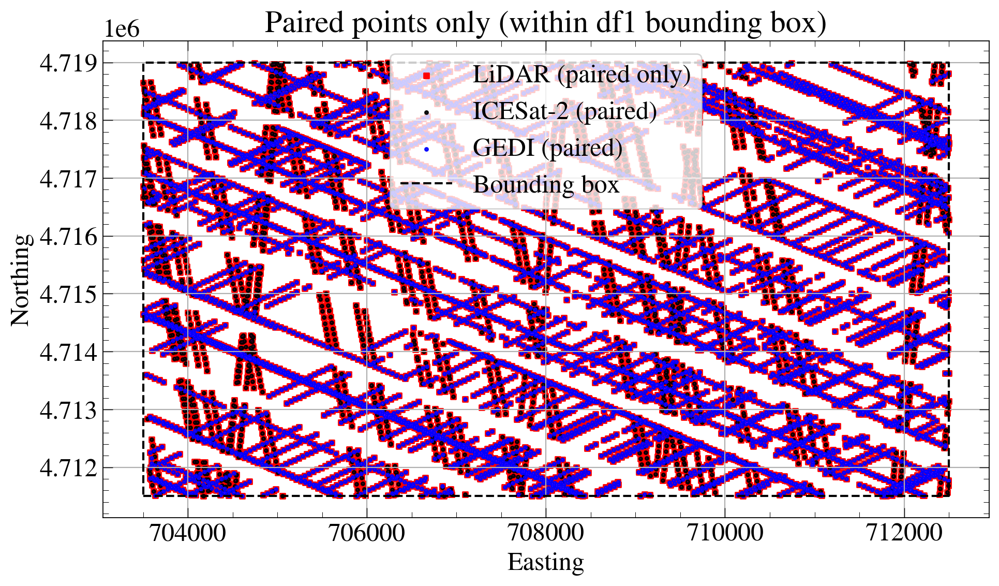

In [33]:
# max_dist = None
max_dist = 5
equal_var = True
pairs_icesat2_twinfalls_ground, pairs_gedi_twinfalls_ground = pair_and_plot_indttest(
    data_airbone_lidar_twinfalls_ground, icesat2_gdf_atl08_twinfalls_ground, 
    gedi_data_twinfalls_ground, xcol="Easting", ycol="Northing", 
    elev_col="Elevation", max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var,   # Welch by default; set True for Student's pooled t-test
    bbox = list(bbox)
)


Independent t-test [df1 vs df2] on 'Elevation' — Student (equal variances)
  n1 = 1694, n2 = 1694, dof ≈ 3386
  mean(df1) = 1137.38, mean(dfX) = 1139.42
  difference (df1 - dfX) = -2.03965
  t = -3.17439, p = 0.00151497
  95% CI (diff): [-3.29944, -0.779859]

Independent t-test [df1 vs df3] on 'Elevation' — Student (equal variances)
  n1 = 5344, n2 = 5344, dof ≈ 1.069e+04
  mean(df1) = 1142.39, mean(dfX) = 1148.54
  difference (df1 - dfX) = -6.14979
  t = -16.0941, p = 1.33077e-57
  95% CI (diff): [-6.8988, -5.40077]


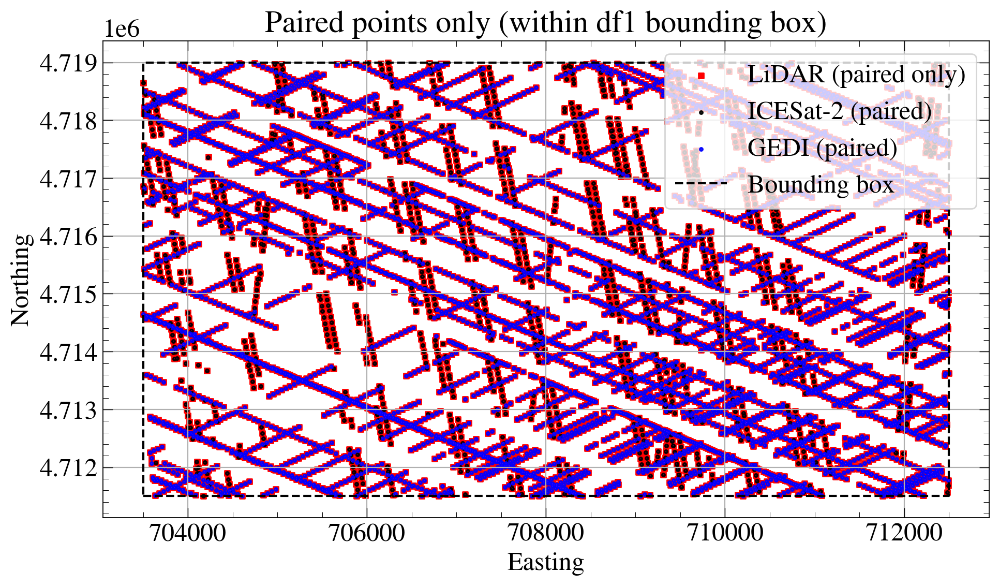

In [34]:
pairs_icesat2_twinfalls_non_ground, pairs_gedi_twinfalls_non_ground = pair_and_plot_indttest(
    data_airbone_lidar_twinfalls_non_ground, icesat2_gdf_atl08_twinfalls_non_ground, 
    gedi_data_twinfalls_non_ground, xcol="Easting", ycol="Northing", 
    elev_col="Elevation", max_dist=max_dist, plot=True, connect_pairs=True,
    equal_var=equal_var,   # Welch by default; set True for Student's pooled t-test
    bbox = list(bbox)
)

### Coregistered Data

In [44]:
coregistered_dir = "/bsuhome/tnde/scratch/carbon_estimation/data/icesat2_data/ml_data/coregistered.csv"
coregistered_data = pd.read_csv(coregistered_dir)
coregistered_data = coregistered_data[["gedi_northing", "gedi_easting", "icesat2_northing", "icesat2_easting", "gedi_elevation", "icesat2_elevation"]]
coregistered_data

,gedi_northing,gedi_easting,icesat2_northing,icesat2_easting,gedi_elevation,icesat2_elevation
0,4.793942e+06,513889.588294,4.793944e+06,513870.684434,1616.121599,1588.731193
1,4.793139e+06,513949.982441,4.793149e+06,513946.488177,1525.787238,1516.670898
2,4.794404e+06,516019.693002,4.794416e+06,516033.863968,1636.325073,1630.054138
3,4.792336e+06,514025.569101,4.792357e+06,514023.394067,1491.882943,17.356073
4,4.772294e+06,516096.784345,4.772316e+06,516107.710860,1795.616508,1792.403856
...,...,...,...,...,...,...
605,4.787763e+06,521488.165310,4.787778e+06,521480.292616,1171.503861,1170.837575
606,4.787732e+06,521535.964281,4.787738e+06,521542.066600,1176.877364,1173.768870
607,4.785780e+06,524494.107413,4.785765e+06,524478.893767,1413.297844,1404.930436
608,4.785749e+06,524541.885754,4.785745e+06,524530.364062,1420.022243,1416.910667


In [49]:
equal_var = True
coregistered_data = coregistered_data[(coregistered_data["gedi_elevation"]>1000)&(coregistered_data["icesat2_elevation"]>1000)]
a = coregistered_data["gedi_elevation"].to_numpy(dtype=float)
b = coregistered_data["icesat2_elevation"].to_numpy(dtype=float)
mask = np.isfinite(a) & np.isfinite(b)
a, b = a[mask], b[mask]
n1, n2 = len(a), len(b)
if n1 < 2 or n2 < 2:
    print(f"[{label}] Not enough data for independent t-test (n1={n1}, n2={n2}).")

mean1, mean2 = a.mean(), b.mean()
var1, var2 = a.var(ddof=1), b.var(ddof=1)
diff = mean1 - mean2

if _HAS_SCIPY:
    t_stat, p_val = stats.ttest_ind(a, b, equal_var=equal_var, nan_policy="omit")
    if equal_var:
        dof = n1 + n2 - 2
        sp2 = ((n1 - 1) * var1 + (n2 - 1) * var2) / dof
        se = np.sqrt(sp2 * (1/n1 + 1/n2))
    else:
        se = np.sqrt(var1 / n1 + var2 / n2)
        dof_num = (var1 / n1 + var2 / n2) ** 2
        dof_den = (var1**2 / (n1**2 * (n1 - 1))) + (var2**2 / (n2**2 * (n2 - 1)))
        dof = dof_num / dof_den
    tcrit = stats.t.ppf(0.975, dof)
    ci_lo, ci_hi = diff - tcrit * se, diff + tcrit * se
else:
    # Manual Welch or pooled t (without p-values / CI)
    if equal_var:
        dof = n1 + n2 - 2
        sp2 = ((n1 - 1) * var1 + (n2 - 1) * var2) / dof
        se = np.sqrt(sp2 * (1/n1 + 1/n2))
    else:
        se = np.sqrt(var1 / n1 + var2 / n2)
        dof_num = (var1 / n1 + var2 / n2) ** 2
        dof_den = (var1**2 / (n1**2 * (n1 - 1))) + (var2**2 / (n2**2 * (n2 - 1)))
        dof = dof_num / dof_den
    t_stat = diff / se if se > 0 else np.nan
    p_val = np.nan
    ci_lo = ci_hi = np.nan

method = "Student (equal variances)" if equal_var else "Welch (unequal variances)"
print(f"\nIndependent t-test — {method}")
print(f"  n1 = {n1}, n2 = {n2}, dof ≈ {dof:.4g}")
print(f"  mean(df1) = {mean1:.6g}, mean(dfX) = {mean2:.6g}")
print(f"  difference (gedi - icesat2) = {diff:.6g}")
print(f"  t = {t_stat:.6g}, p = {p_val:.6g}")
print(f"  95% CI (diff): [{ci_lo:.6g}, {ci_hi:.6g}]")



Independent t-test — Student (equal variances)
  n1 = 590, n2 = 590, dof ≈ 1178
  mean(df1) = 1541.24, mean(dfX) = 1539.52
  difference (gedi - icesat2) = 1.72717
  t = 0.116361, p = 0.907386
  95% CI (diff): [-27.3949, 30.8492]


In [50]:
coregistered_data["elevation_diff"] = coregistered_data["gedi_elevation"] - coregistered_data["icesat2_elevation"]
coregistered_data

,gedi_northing,gedi_easting,icesat2_northing,icesat2_easting,gedi_elevation,icesat2_elevation,diff
0,4.793942e+06,513889.588294,4.793944e+06,513870.684434,1616.121599,1588.731193,27.390406
1,4.793139e+06,513949.982441,4.793149e+06,513946.488177,1525.787238,1516.670898,9.116340
2,4.794404e+06,516019.693002,4.794416e+06,516033.863968,1636.325073,1630.054138,6.270935
4,4.772294e+06,516096.784345,4.772316e+06,516107.710860,1795.616508,1792.403856,3.212652
5,4.772325e+06,516143.702589,4.772332e+06,516153.911117,1791.679395,1783.746705,7.932690
...,...,...,...,...,...,...,...
605,4.787763e+06,521488.165310,4.787778e+06,521480.292616,1171.503861,1170.837575,0.666286
606,4.787732e+06,521535.964281,4.787738e+06,521542.066600,1176.877364,1173.768870,3.108494
607,4.785780e+06,524494.107413,4.785765e+06,524478.893767,1413.297844,1404.930436,8.367408
608,4.785749e+06,524541.885754,4.785745e+06,524530.364062,1420.022243,1416.910667,3.111576


In [51]:
coregistered_data["elevation_diff"].abs().describe()

count    590.000000
mean       5.037944
std        5.352861
min        0.000017
25%        1.339933
50%        3.342236
75%        7.075179
max       44.505309
Name: diff, dtype: float64

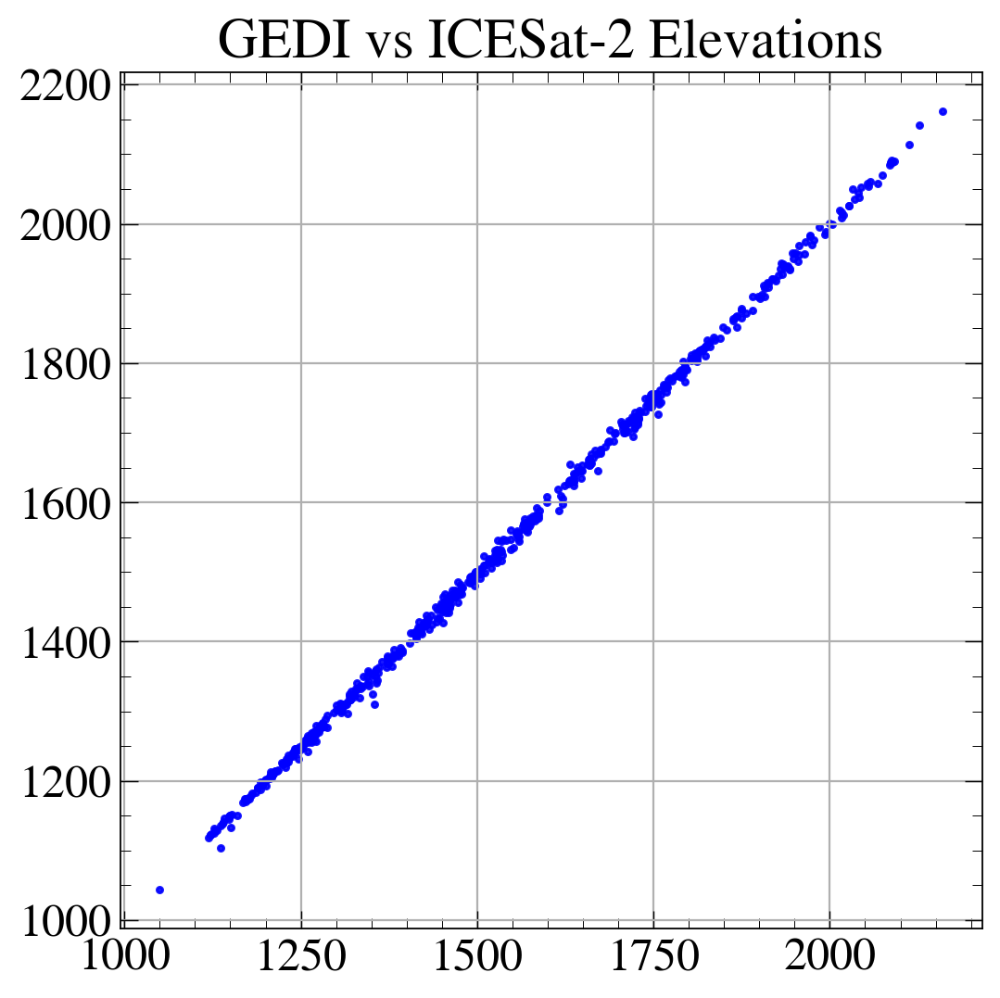

In [52]:
plt.scatter(coregistered_data["gedi_elevation"], coregistered_data["icesat2_elevation"], s=5, alpha=0.9, color="blue", label="GEDI (paired)")
plt.title("GEDI vs ICESat-2 Elevations")# - Coregistered Footprints")
plt.show()

# The End!!!

In [25]:
import rasterio
dsm = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"

# Open the GeoTIFF
with rasterio.open(dsm) as src:
    data = src.read()           # Read all bands into a NumPy array
    profile = src.profile       # Metadata (e.g., CRS, transform)
    print("Shape:", data.shape) # (bands, height, width)
    print("CRS:", src.crs)
    print("Transform:", src.transform)


Shape: (1, 135445, 90890)
CRS: COMPD_CS["NAD83 / Idaho Transverse Mercator + NAVD88 height",PROJCS["NAD83 / Idaho Transverse Mercator",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",42],PARAMETER["central_meridian",-114],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",2500000],PARAMETER["false_northing",1200000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","8826"]],VERT_CS["NAVD88 height",VERT_DATUM["North American Vertical Datum 1988",2005,AUTHORITY["EPSG","5103"]],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Gravity-related height",UP],AUTHORITY["EPSG","5703"]]]
Transform: | 1.00, 0.00, 2250397.09|
| 0.00,-1.00, 1406102.87|
| 0

In [16]:
import rasterio

dsm = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"

with rasterio.open(dsm) as src:
    print("CRS:", src.crs)
    print("Size (width x height):", src.width, "x", src.height)
    print("Number of bands:", src.count)

    # Read a subset (window) to keep memory manageable
    window = rasterio.windows.Window(0, 0, 2000, 2000)  # top-left 2000×2000 px
    # dsm_chunk = src.read(1, window=window)
    dsm_chunk = src.read(1, masked=True)

print("Chunk shape:", dsm_chunk.shape)

CRS: COMPD_CS["NAD83 / Idaho Transverse Mercator + NAVD88 height",PROJCS["NAD83 / Idaho Transverse Mercator",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",42],PARAMETER["central_meridian",-114],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",2500000],PARAMETER["false_northing",1200000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","8826"]],VERT_CS["NAVD88 height",VERT_DATUM["North American Vertical Datum 1988",2005,AUTHORITY["EPSG","5103"]],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Gravity-related height",UP],AUTHORITY["EPSG","5703"]]]
Size (width x height): 90890 x 135445
Number of bands: 1
Chunk shape: (135445, 90890)


In [20]:
import rasterio

# tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/Int/11TNH160700.tif"
tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH160700.tif"

with rasterio.open(tif_path) as src:
    print("Bands:", src.count)
    for i in range(1, src.count + 1):
        band = src.read(i, masked=True)  # masked=True respects nodata
        print(f"Band {i}: shape={band.shape}, dtype={band.dtype}, "
              f"min={band.min()}, max={band.max()}, mean={band.mean():.2f}")
# <- src is closed here; do not use it anymore


Bands: 1
Band 1: shape=(750, 750), dtype=float32, min=1736.47998046875, max=2121.31005859375, mean=1918.54


In [3]:
import rasterio

tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/Int/11TNH160685.tif"
# tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH160700.tif"

with rasterio.open(tif_path) as src:
    # --- Basic info ---
    print("Driver:", src.driver)          # e.g., GTiff
    print("Width x Height:", src.width, "x", src.height)
    print("Band count:", src.count)       # number of bands (1 here)
    print("Data type:", src.dtypes[0])    # e.g., float32, int16
    print("NoData value:", src.nodata)
    print("Bounds:", src.bounds)          # left, bottom, right, top (map coords)
    print("Transform:", src.transform)    # Affine map<->pixel transform
    print("CRS:", src.crs)                # Coordinate reference system

    # --- Metadata ---
    print("\nTags (global metadata):", src.tags())       # key-value metadata dictionary
    print("\nBand-specific tags:", src.tags(1))          # metadata for band 1

    # --- Statistics ---
    band1 = src.read(1, masked=True)
    print(f"\nBand 1 shape: {band1.shape}")
    print(f"Min={band1.min()}, Max={band1.max()}, Mean={float(band1.mean()):.3f}")


Driver: GTiff
Width x Height: 1500 x 1500
Band count: 1
Data type: uint8
NoData value: 0.0
Bounds: BoundingBox(left=516000.0, bottom=4768500.0, right=517500.0, top=4770000.0)
Transform: | 1.00, 0.00, 516000.00|
| 0.00,-1.00, 4770000.00|
| 0.00, 0.00, 1.00|
CRS: EPSG:6340

Tags (global metadata): {'AREA_OR_POINT': 'Area', 'DataType': 'Generic'}

Band-specific tags: {'RepresentationType': 'ATHEMATIC', 'STATISTICS_MAXIMUM': '32', 'STATISTICS_MEAN': '11.274508444444', 'STATISTICS_MINIMUM': '1', 'STATISTICS_STDDEV': '4.4095146372533'}

Band 1 shape: (1500, 1500)
Min=1, Max=32, Mean=11.275


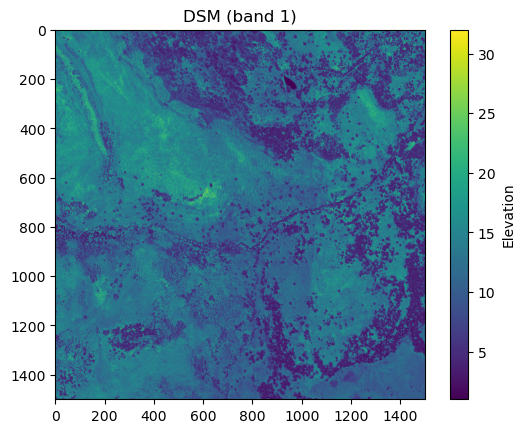

In [4]:
import matplotlib.pyplot as plt
plt.imshow(band1, cmap="viridis")
plt.colorbar(label="Elevation")
plt.title("DSM (band 1)")
plt.show()


In [1]:
import rasterio

tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_01.tif"

with rasterio.open(tif_path) as src:
    # --- Basic info ---
    print("Driver:", src.driver)          # e.g., GTiff
    print("Width x Height:", src.width, "x", src.height)
    print("Band count:", src.count)       # number of bands (1 here)
    print("Data type:", src.dtypes[0])    # e.g., float32, int16
    print("NoData value:", src.nodata)
    print("Bounds:", src.bounds)          # left, bottom, right, top (map coords)
    print("Transform:", src.transform)    # Affine map<->pixel transform
    print("CRS:", src.crs)                # Coordinate reference system

    # --- Metadata ---
    print("\nTags (global metadata):", src.tags())       # key-value metadata dictionary
    print("\nBand-specific tags:", src.tags(1))          # metadata for band 1

    # --- Statistics ---
    band1 = src.read(1, masked=True)
    print(f"\nBand 1 shape: {band1.shape}")
    print(f"Min={band1.min()}, Max={band1.max()}, Mean={float(band1.mean()):.3f}")


Driver: GTiff
Width x Height: 50729 x 60655
Band count: 1
Data type: float32
NoData value: 3.3999999521443642e+38
Bounds: BoundingBox(left=2254455.1052, bottom=1345349.0513000004, right=2305184.1052, top=1406004.0513000004)
Transform: | 1.00, 0.00, 2254455.11|
| 0.00,-1.00, 1406004.05|
| 0.00, 0.00, 1.00|
CRS: EPSG:8826

Tags (global metadata): {'AREA_OR_POINT': 'Area', 'DataType': 'Generic'}

Band-specific tags: {'BandName': 'Band_1', 'RepresentationType': 'ATHEMATIC', 'STATISTICS_COUNT': '1372103367.000000', 'STATISTICS_EXCLUDEDVALUES': '0', 'STATISTICS_MAXIMUM': '1041.1572265625', 'STATISTICS_MEAN': '755.63209256223', 'STATISTICS_MEDIAN': '737.523536', 'STATISTICS_MINIMUM': '665.29998779297', 'STATISTICS_SKIPFACTORX': '1', 'STATISTICS_SKIPFACTORY': '1', 'STATISTICS_STDDEV': '55.197928662649'}

Band 1 shape: (60655, 50729)
Min=0.0, Max=1041.1572265625, Mean=755.617


In [7]:
# import matplotlib.pyplot as plt
# plt.imshow(band1, cmap="viridis")
# plt.colorbar(label="Elevation")
# plt.title("DSM (band 1)")
# plt.show()


In [8]:
import rasterio

tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/Other/11TNH160700.tif"

with rasterio.open(tif_path) as src:
    # --- Basic info ---
    print("Driver:", src.driver)          # e.g., GTiff
    print("Width x Height:", src.width, "x", src.height)
    print("Band count:", src.count)       # number of bands (1 here)
    print("Data type:", src.dtypes[0])    # e.g., float32, int16
    print("NoData value:", src.nodata)
    print("Bounds:", src.bounds)          # left, bottom, right, top (map coords)
    print("Transform:", src.transform)    # Affine map<->pixel transform
    print("CRS:", src.crs)                # Coordinate reference system

    # --- Metadata ---
    print("\nTags (global metadata):", src.tags())       # key-value metadata dictionary
    print("\nBand-specific tags:", src.tags(1))          # metadata for band 1

    # --- Statistics ---
    band1 = src.read(1, masked=True)
    print(f"\nBand 1 shape: {band1.shape}")
    print(f"Min={band1.min()}, Max={band1.max()}, Mean={float(band1.mean()):.3f}")


Driver: GTiff
Width x Height: 750 x 750
Band count: 3
Data type: uint8
NoData value: 0.0
Bounds: BoundingBox(left=516000.0, bottom=4770000.0, right=517500.0, top=4771500.0)
Transform: | 2.00, 0.00, 516000.00|
| 0.00,-2.00, 4771500.00|
| 0.00, 0.00, 1.00|
CRS: EPSG:6340

Tags (global metadata): {'AREA_OR_POINT': 'Area', 'DataType': 'Generic'}

Band-specific tags: {'RepresentationType': 'ATHEMATIC', 'STATISTICS_MAXIMUM': '146', 'STATISTICS_MEAN': '77.059598222222', 'STATISTICS_MINIMUM': '1', 'STATISTICS_STDDEV': '64.382310780099'}

Band 1 shape: (750, 750)
Min=1, Max=146, Mean=77.060


In [9]:
plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

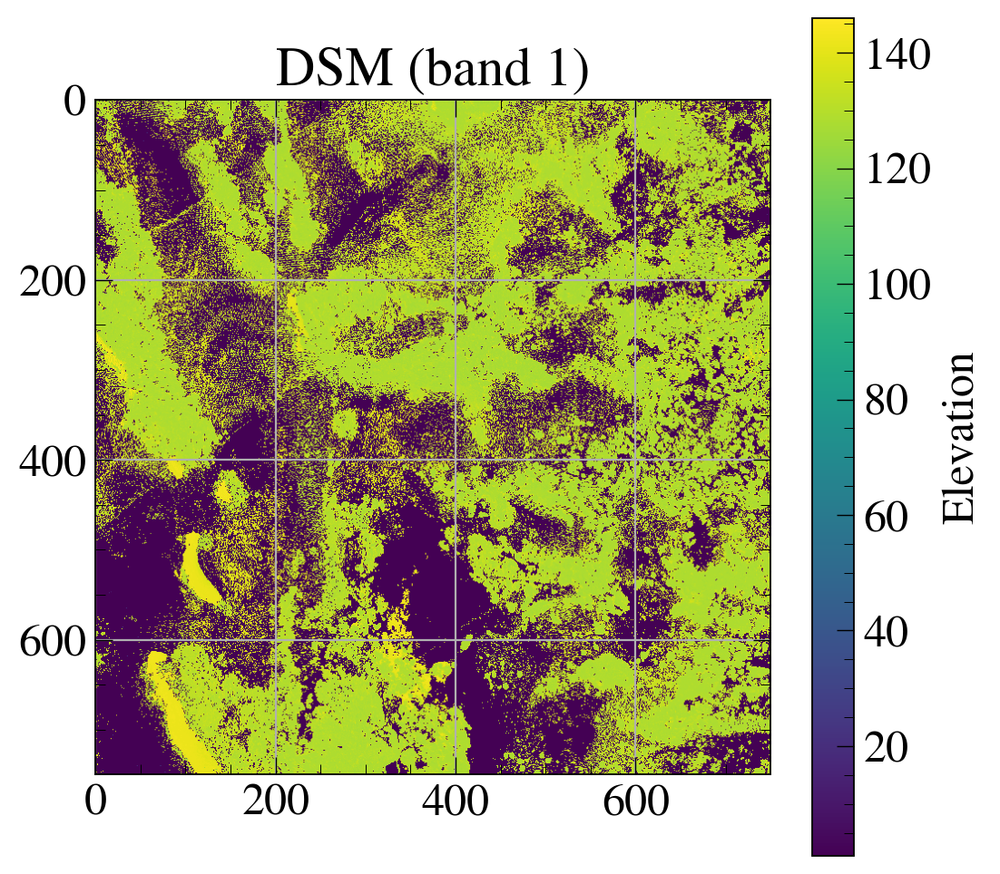

In [10]:
import matplotlib.pyplot as plt
plt.imshow(band1, cmap="viridis")
plt.colorbar(label="Elevation")
plt.title("DSM (band 1)")
plt.show()

In [1]:
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling

def chm_from_highesthit_and_dtm(highest_hit_path, dtm_path, out_path, *, resampling=Resampling.bilinear):
    """
    Compute Canopy Height Model (CHM) over the extent of the highest-hit raster by
    reprojecting/resampling the DTM to the highest-hit grid and subtracting: CHM = HH - DTM.

    Parameters
    ----------
    highest_hit_path : str
        Path to highest-hit raster (acts like DSM); defines target grid/CRS/extent.
    dtm_path : str
        Path to bare-earth DTM raster (may be larger extent and/or different CRS/resolution).
    out_path : str
        Output path for CHM GeoTIFF.
    resampling : rasterio.warp.Resampling, optional
        Resampling method for continuous elevation data. Default: bilinear.

    Notes
    -----
    - Works even if CRS/resolution differ; DTM is reprojected onto highest-hit grid.
    - Output CHM has the same georeferencing, size, and bbox as the highest-hit raster.
    - Negative values (due to mismatches/noise) are clipped to 0.
    """

    # Open sources
    with rasterio.open(highest_hit_path) as hh_src, rasterio.open(dtm_path) as dtm_src:
        # Read the highest hit (single band assumed)
        hh = hh_src.read(1, masked=True)
        hh_profile = hh_src.profile.copy()

        # Prepare destination (aligned DTM) with same shape as highest hit
        dtm_aligned = np.empty(hh.shape, dtype=np.float32)

        # Determine NoData handling
        dtm_nodata = dtm_src.nodata
        if dtm_nodata is None:
            # If missing, try to infer a nodata mask from unreasonable values
            dtm_nodata = np.nan  # let reproject generate valid_mask, we’ll mask later

        # Reproject DTM -> highest-hit grid (this crops to the highest-hit bbox)
        reproject(
            source=rasterio.band(dtm_src, 1),
            destination=dtm_aligned,
            src_transform=dtm_src.transform,
            src_crs=dtm_src.crs,
            src_nodata=dtm_src.nodata,
            dst_transform=hh_src.transform,
            dst_crs=hh_src.crs,
            dst_nodata=np.nan,               # keep NaNs where DTM has no data after reprojection
            resampling=resampling,
        )

    # Build masked arrays respecting nodata/NaN
    dtm_aligned_ma = np.ma.masked_invalid(dtm_aligned)
    hh_ma = np.ma.masked_array(hh, mask=np.ma.getmaskarray(hh) | np.ma.getmaskarray(dtm_aligned_ma))

    # Compute CHM and clip negatives to 0
    chm = (hh_ma - dtm_aligned_ma).filled(np.nan)
    chm = np.where(np.isfinite(chm), chm, np.nan)
    chm = np.clip(chm, 0, None).astype(np.float32)

    # Write CHM with highest-hit georeferencing
    out_profile = hh_profile.copy()
    out_profile.update(
        dtype=rasterio.float32,
        count=1,
        nodata=np.nan
    )

    with rasterio.open(out_path, "w", **out_profile) as dst:
        dst.write(chm, 1)

    # Optional quick stats
    finite = np.isfinite(chm)
    if finite.any():
        chm_min, chm_max, chm_mean = float(chm[finite].min()), float(chm[finite].max()), float(chm[finite].mean())
        print(f"CHM written to: {out_path}")
        print(f"Stats over highest-hit bbox -> min={chm_min:.2f} m, max={chm_max:.2f} m, mean={chm_mean:.2f} m")
    else:
        print(f"CHM written to: {out_path} (all values are NaN after reprojection/masking)")

if __name__ == "__main__":
    # ---- usage ----
    hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH160685.tif"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    chm_from_highesthit_and_dtm(
        highest_hit_path=hh_tif_path,
        dtm_path=be_tif_path,
        out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif",
    )


CHM written to: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif
Stats over highest-hit bbox -> min=0.00 m, max=36.09 m, mean=4.48 m


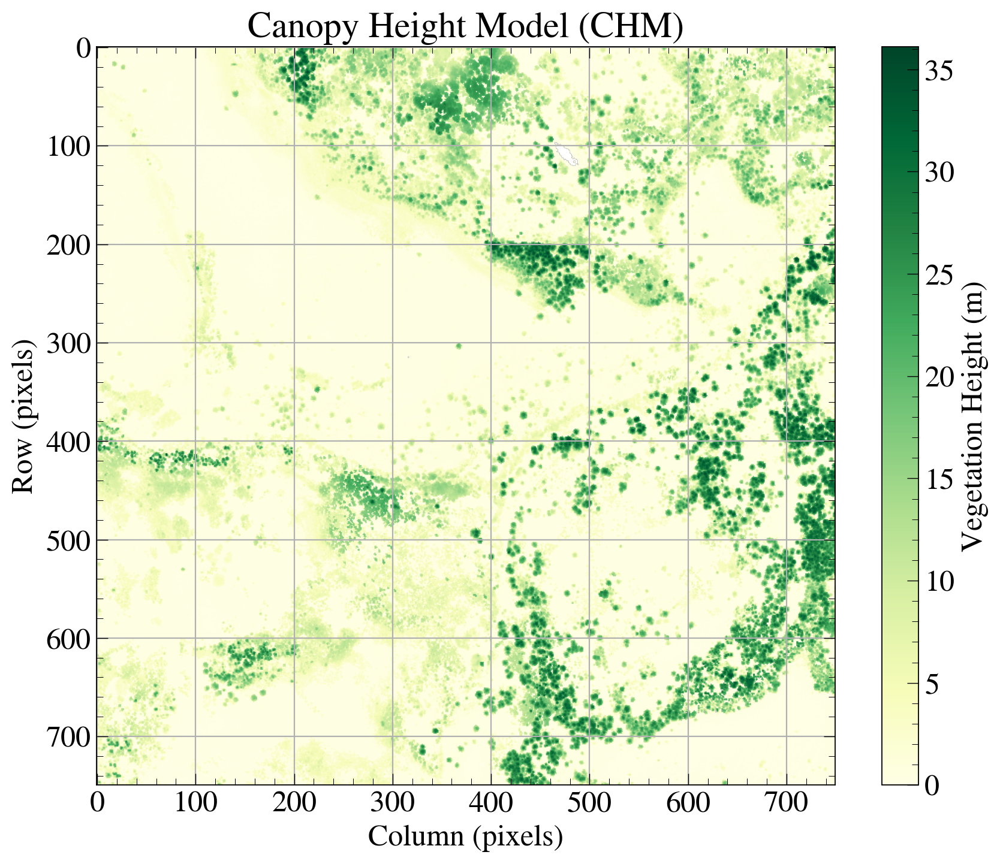

In [37]:
import rasterio
import matplotlib.pyplot as plt
plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

chm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif"

with rasterio.open(chm_path) as src:
    chm = src.read(1, masked=True)

plt.figure(figsize=(10, 8))
plt.imshow(chm, cmap="YlGn", vmin=0)
plt.colorbar(label="Vegetation Height (m)")
plt.title("Canopy Height Model (CHM)")
plt.xlabel("Column (pixels)")
plt.ylabel("Row (pixels)")
plt.show()


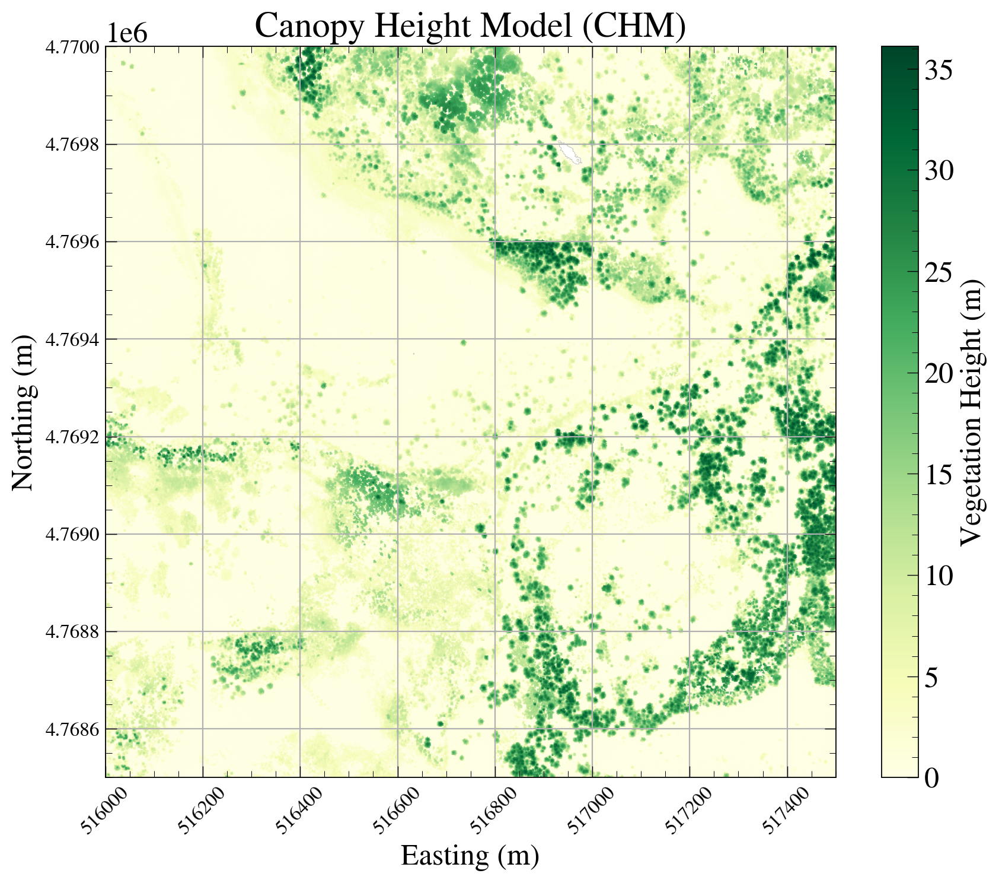

In [41]:
import rasterio
import matplotlib.pyplot as plt
from rasterio.plot import show

chm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_highest_hit_extent.tif"

with rasterio.open(chm_path) as src:
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, cmap="YlGn", vmin=0)
    ax.set_title("Canopy Height Model (CHM)")
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax.tick_params(axis='y', labelsize=12)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    # Add colorbar
    im = ax.get_images()[0]   # grab the image drawn by rasterio
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Vegetation Height (m)")

plt.show()


In [42]:
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling

def resample_to_target(src_path, target_src, *, resampling=Resampling.bilinear, dst_dtype=np.float32):
    """
    Reproject/resample a raster (src_path) onto the grid/CRS of an already-open
    target rasterio dataset (target_src). Returns the aligned array.
    """
    with rasterio.open(src_path) as s:
        dst = np.empty((target_src.height, target_src.width), dtype=dst_dtype)
        reproject(
            source=rasterio.band(s, 1),
            destination=dst,
            src_transform=s.transform,
            src_crs=s.crs,
            src_nodata=s.nodata,
            dst_transform=target_src.transform,
            dst_crs=target_src.crs,
            dst_nodata=np.nan,                   # keep NaNs where source has no data
            resampling=resampling,
        )
    return dst

def chm_from_dsm_and_dtm_over_highesthit_bbox(
    highest_hit_path, dsm_path, dtm_path,
    out_chm_path, out_dsm_aligned_path=None, out_dtm_aligned_path=None,
    *, dsm_resampling=Resampling.bilinear, dtm_resampling=Resampling.bilinear,
    clip_negative_to_zero=True
):
    """
    Align DSM and DTM to the bounding box and grid of the highest-hit raster,
    then compute CHM = DSM_aligned - DTM_aligned, and write to GeoTIFF.

    Parameters
    ----------
    highest_hit_path : str
        Path to the highest-hit raster (defines target CRS, transform, size, bbox).
    dsm_path : str
        Path to DSM raster (surface elevations).
    dtm_path : str
        Path to bare-earth DTM raster (ground elevations).
    out_chm_path : str
        Output CHM GeoTIFF path.
    out_dsm_aligned_path : str, optional
        If given, also write the DSM aligned to the highest-hit grid.
    out_dtm_aligned_path : str, optional
        If given, also write the DTM aligned to the highest-hit grid.
    dsm_resampling : rasterio.warp.Resampling
        Resampling kernel for DSM (continuous surface -> bilinear/cubic).
    dtm_resampling : rasterio.warp.Resampling
        Resampling kernel for DTM (continuous surface -> bilinear/cubic).
    clip_negative_to_zero : bool
        If True, negative CHM values are set to 0.

    Returns
    -------
    dict with paths and basic stats.
    """
    with rasterio.open(highest_hit_path) as hh_src:
        target_profile = hh_src.profile.copy()
        target_profile.update(count=1, dtype=rasterio.float32, nodata=np.nan)

        # Reproject/crop DSM & DTM onto highest-hit grid
        dsm_aligned = resample_to_target(dsm_path, hh_src, resampling=dsm_resampling)
        dtm_aligned = resample_to_target(dtm_path, hh_src, resampling=dtm_resampling)

        # Mask invalids
        dsm_ma = np.ma.masked_invalid(dsm_aligned)
        dtm_ma = np.ma.masked_invalid(dtm_aligned)
        common_mask = np.ma.getmaskarray(dsm_ma) | np.ma.getmaskarray(dtm_ma)

        # Compute CHM = DSM - DTM over highest-hit bbox
        chm = (dsm_ma - dtm_ma).filled(np.nan).astype(np.float32)
        if clip_negative_to_zero:
            chm = np.where(np.isfinite(chm), np.maximum(chm, 0.0), np.nan).astype(np.float32)

        # Write outputs
        if out_dsm_aligned_path:
            prof = target_profile.copy()
            with rasterio.open(out_dsm_aligned_path, "w", **prof) as dst:
                dst.write(dsm_aligned.astype(np.float32), 1)

        if out_dtm_aligned_path:
            prof = target_profile.copy()
            with rasterio.open(out_dtm_aligned_path, "w", **prof) as dst:
                dst.write(dtm_aligned.astype(np.float32), 1)

        with rasterio.open(out_chm_path, "w", **target_profile) as dst:
            dst.write(chm, 1)

    # Stats
    finite = np.isfinite(chm)
    stats = {}
    if finite.any():
        stats = {
            "min": float(chm[finite].min()),
            "max": float(chm[finite].max()),
            "mean": float(chm[finite].mean()),
        }

    return {
        "chm_path": out_chm_path,
        "dsm_aligned_path": out_dsm_aligned_path,
        "dtm_aligned_path": out_dtm_aligned_path,
        "stats": stats,
    }

if __name__ == "__main__":
    # ---- usage ----
    hh_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/hh/11TNH160685.tif"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"
    out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"

    res = chm_from_dsm_and_dtm_over_highesthit_bbox(
        highest_hit_path=hh_tif_path,
        dsm_path=dsm_path,
        dtm_path=be_tif_path, #bare earth raster
        out_chm_path=out_path,
        out_dsm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_aligned.tif",
        out_dtm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_aligned.tif",
        dsm_resampling=Resampling.bilinear,
        dtm_resampling=Resampling.bilinear,  # or cubic; use nearest only if your DTM is categorical
    )
    print("CHM:", res["chm_path"], "Stats:", res["stats"])

CHM: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif Stats: {'min': 0.0, 'max': 35.1763916015625, 'mean': 4.470770359039307}


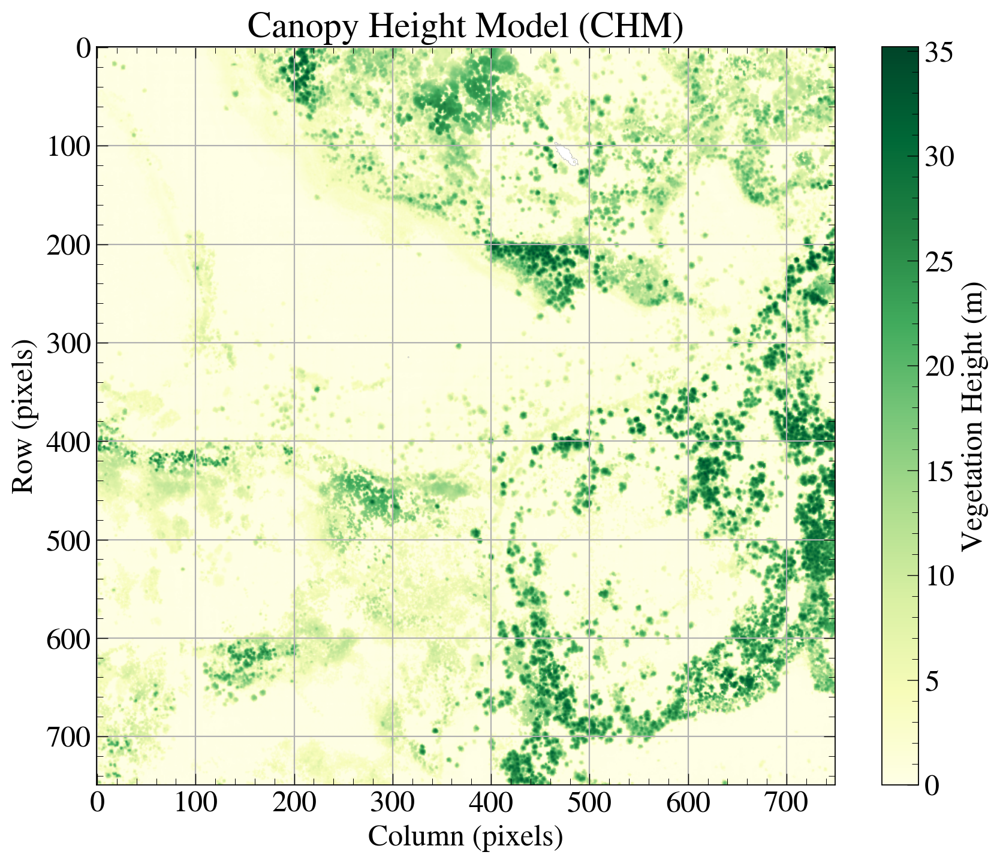

In [43]:
import rasterio
import matplotlib.pyplot as plt
plt.style.use("~/geoscience/carbon_estimation/MNRAS.mplstyle")
%matplotlib inline

chm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"

with rasterio.open(chm_path) as src:
    chm = src.read(1, masked=True)

plt.figure(figsize=(10, 8))
plt.imshow(chm, cmap="YlGn", vmin=0)
plt.colorbar(label="Vegetation Height (m)")
plt.title("Canopy Height Model (CHM)")
plt.xlabel("Column (pixels)")
plt.ylabel("Row (pixels)")
plt.show()

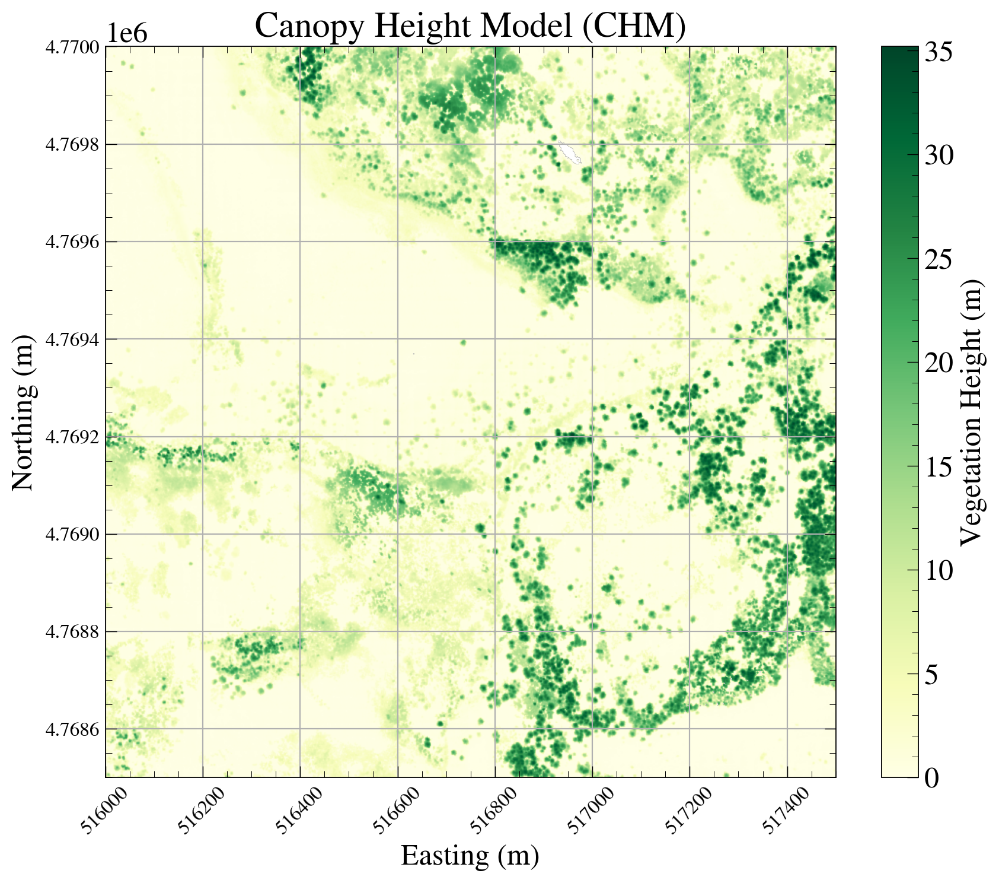

In [44]:
with rasterio.open(chm_path) as src:
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, cmap="YlGn", vmin=0)
    ax.set_title("Canopy Height Model (CHM)")
    ax.tick_params(axis='x', labelsize=12, rotation=45)
    ax.tick_params(axis='y', labelsize=12)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    # Add colorbar
    im = ax.get_images()[0]   # grab the image drawn by rasterio
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Vegetation Height (m)")

plt.show()


In [28]:
import json
import laspy
import rasterio
import numpy as np
from pyproj import Transformer
from rasterio.windows import from_bounds
from rasterio.warp import reproject, Resampling

# ---- Helper: get LAZ bounds and CRS with PDAL ----
import json
import pdal
import numpy as np
import rasterio
from rasterio.windows import from_bounds
from rasterio.warp import reproject, Resampling, calculate_default_transform
from pyproj import Transformer

# ---------- Read LAZ bbox via PDAL ----------
def laz_bounds_and_epsg(laz_path, fallback_epsg=6340):
    """
    Robust LAZ bounds + EPSG reader.
    Prefers PDAL (filters.stats), falls back to readers.las bounds string,
    then to laspy header mins/maxs. Returns ((minx,miny,maxx,maxy), epsg_int_or_None).
    """
    # ---- Try PDAL first (stats) ----
    try:
        pipe = {
            "pipeline": [
                {"type": "readers.las", "filename": laz_path},
                {"type": "filters.stats"}
            ]
        }
        p = pdal.Pipeline(json.dumps(pipe))
        p.execute()
        md = p.metadata
        if not isinstance(md, dict):
            md = json.loads(md)

        # 1) Newer PDAL: filters.stats → bbox.native.{minx,miny,maxx,maxy}
        stats = md.get("metadata", {}).get("filters.stats", {})
        bbox_native = (
            stats.get("bbox", {})
                 .get("native", {})
        )
        if {"minx", "miny", "maxx", "maxy"} <= set(bbox_native.keys()):
            minx = float(bbox_native["minx"])
            miny = float(bbox_native["miny"])
            maxx = float(bbox_native["maxx"])
            maxy = float(bbox_native["maxy"])
            # EPSG from readers.las (if present)
            srs = md.get("metadata", {}).get("readers.las", {}).get("srs", {})
            epsg = srs.get("horizontal", {}).get("epsg") or fallback_epsg
            return (minx, miny, maxx, maxy), int(epsg) if epsg is not None else None

        # 2) Older PDAL: readers.las → "bounds" as a string "([minx,maxx],[miny,maxy],[minz,maxz])"
        readers = md.get("metadata", {}).get("readers.las", {})
        if "bounds" in readers:
            btxt = readers["bounds"]
            nums = [float(x) for x in btxt.translate(str.maketrans("", "", "()[ ]")).split(",")]
            minx, maxx, miny, maxy = nums[0], nums[1], nums[2], nums[3]
            srs = readers.get("srs", {})
            epsg = srs.get("horizontal", {}).get("epsg") or fallback_epsg
            return (minx, miny, maxx, maxy), int(epsg) if epsg is not None else None

        # If PDAL ran but provided neither, fall through to laspy
    except Exception:
        # PDAL not installed or failed; fall back to laspy
        pass

    # ---- Fallback: laspy header mins/maxs (fast; no need to load all points) ----
    import laspy
    laz = laspy.read(laz_path)
    # laspy 2.x header has mins/maxs arrays: [x, y, z]
    try:
        mins = laz.header.mins
        maxs = laz.header.maxs
        minx, miny, maxx, maxy = float(mins[0]), float(mins[1]), float(maxs[0]), float(maxs[1])
    except Exception:
        # ultra-fallback: compute from coordinates (slower)
        import numpy as np
        minx, miny = float(np.min(laz.x)), float(np.min(laz.y))
        maxx, maxy = float(np.max(laz.x)), float(np.max(laz.y))

    return (minx, miny, maxx, maxy), int(fallback_epsg) if fallback_epsg is not None else None

def laz_bounds_fallback_with_laspy(laz_path, epsg=6340):
    import laspy, numpy as np
    laz = laspy.read(laz_path)
    return (
        float(np.min(laz.x)), 
        float(np.min(laz.y)), 
        float(np.max(laz.x)), 
        float(np.max(laz.y))
    ), int(epsg)

def _bbox_to_crs(bounds, src_epsg, dst_crs):
    tfm = Transformer.from_crs(f"EPSG:{src_epsg}", dst_crs, always_xy=True)
    x0, y0 = tfm.transform(bounds[0], bounds[1])
    x1, y1 = tfm.transform(bounds[2], bounds[3])
    return (min(x0, x1), min(y0, y1), max(x0, x1), max(y0, y1))

def _crop_read(src, bbox_in_src_crs):
    # intersect with dataset bounds, get window, read masked array + window transform
    db = src.bounds
    xmin = max(bbox_in_src_crs[0], db.left)
    ymin = max(bbox_in_src_crs[1], db.bottom)
    xmax = min(bbox_in_src_crs[2], db.right)
    ymax = min(bbox_in_src_crs[3], db.top)
    if not (xmin < xmax and ymin < ymax):
        raise ValueError("LAZ bbox does not intersect raster extent.")
    win = from_bounds(xmin, ymin, xmax, ymax, transform=src.transform).round_offsets().round_lengths()
    arr = src.read(1, window=win, masked=True).astype(np.float32)
    xform = src.window_transform(win)
    return arr, xform, (xmin, ymin, xmax, ymax)

def chm_over_laz_bbox_windowed(
    laz_path,
    dsm_path,
    dtm_path,
    out_dsm_crop_6340,
    out_dtm_aligned_6340,
    out_chm_6340,
    *,
    laz_fallback_epsg=6340,
    dtm_resampling=Resampling.bilinear,
    compress="DEFLATE"
):
    """Write only the DSM/DTM/CHM over the LAZ bbox, all in EPSG:6340."""
    # LAZ bbox & CRS
    laz_bbox_native, laz_epsg = laz_bounds_and_epsg(laz_path, fallback_epsg=laz_fallback_epsg)
    
    # try:
    #     laz_bbox_native, laz_epsg = laz_bounds_and_epsg(laz_path, fallback_epsg=laz_fallback_epsg)
    # except Exception as e:
    #     print(f"[Warning] PDAL failed to read bounds: {e}")
    #     print("Falling back to laspy header for bounding box...")
    #     laz_bbox_native, laz_epsg = laz_bounds_fallback_with_laspy(laz_path, epsg=laz_fallback_epsg)

    try:
        laz_bbox_native, laz_epsg = laz_bounds_fallback_with_laspy(laz_path, epsg=laz_fallback_epsg)
    except Exception as e:
        print(f"[Warning] Default bbox failed to read bounds: {e}")
        print("Falling back to PDAL for bounding box...")
        laz_bbox_native, laz_epsg = laz_bounds_and_epsg(laz_path, fallback_epsg=laz_fallback_epsg)

    # Window-read DSM & DTM in their native CRSs using the LAZ bbox reprojected per raster
    with rasterio.open(dsm_path) as dsm_src:
        dsm_bbox_native = _bbox_to_crs(laz_bbox_native, laz_epsg, dsm_src.crs)
        dsm_crop, dsm_crop_xf, dsm_crop_bounds = _crop_read(dsm_src, dsm_bbox_native)
        dsm_dtype = dsm_src.dtypes[0]
        dsm_nodata = dsm_src.nodata

    with rasterio.open(dtm_path) as dtm_src:
        dtm_bbox_native = _bbox_to_crs(laz_bbox_native, laz_epsg, dtm_src.crs)
        dtm_crop, dtm_crop_xf, dtm_crop_bounds = _crop_read(dtm_src, dtm_bbox_native)
        dtm_nodata = dtm_src.nodata

    # Define a small target grid in EPSG:6340 from the DSM crop bounds/size
    #    (Keeps approximately the DSM crop resolution after reprojection.)
    src_crs = rasterio.open(dsm_path).crs
    dst_crs = "EPSG:6340"
    # Use DSM crop's width/height as a starting target shape
    crop_h, crop_w = dsm_crop.shape
    # Calculate transform/shape for DSM crop -> EPSG:6340 using crop bounds
    dst_transform, dst_width, dst_height = calculate_default_transform(
        src_crs, dst_crs, crop_w, crop_h, *dsm_crop_bounds
    )

    # Reproject DSM crop -> 6340
    dsm_6340 = np.empty((dst_height, dst_width), dtype=np.float32)
    reproject(
        source=dsm_crop.filled(dsm_nodata if dsm_nodata is not None else np.nan),
        destination=dsm_6340,
        src_transform=dsm_crop_xf,
        src_crs=src_crs,
        src_nodata=dsm_nodata,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        dst_nodata=np.nan,
        resampling=Resampling.bilinear,
    )

    # Reproject DTM crop -> same 6340 grid
    dtm_6340 = np.empty((dst_height, dst_width), dtype=np.float32)
    reproject(
        source=dtm_crop.filled(dtm_nodata if dtm_nodata is not None else np.nan),
        destination=dtm_6340,
        src_transform=dtm_crop_xf,
        src_crs=rasterio.open(dtm_path).crs,
        src_nodata=dtm_nodata,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        dst_nodata=np.nan,
        resampling=dtm_resampling,
    )

    # CHM = DSM - DTM (clip negatives to 0)
    dsm_ma = np.ma.masked_invalid(dsm_6340)
    dtm_ma = np.ma.masked_invalid(dtm_6340)
    chm = (dsm_ma - dtm_ma).filled(np.nan).astype(np.float32)
    chm = np.where(np.isfinite(chm), np.maximum(chm, 0.0), np.nan).astype(np.float32)

    # Write ONLY the small, cropped outputs (tiled + compressed; BigTIFF not needed for small windows)
    def _write_tiff(path, array, transform, crs):
        profile = {
            "driver": "GTiff",
            "height": array.shape[0],
            "width": array.shape[1],
            "count": 1,
            "dtype": rasterio.float32,
            "crs": crs,
            "transform": transform,
            "nodata": np.nan,
            "tiled": True,
            "blockxsize": 512,
            "blockysize": 512,
            "compress": compress,
            "predictor": 3,       # better for float
        }
        with rasterio.open(path, "w", **profile) as dst:
            dst.write(array, 1)

    _write_tiff(out_dsm_crop_6340, dsm_6340, dst_transform, dst_crs)
    _write_tiff(out_dtm_aligned_6340, dtm_6340, dst_transform, dst_crs)
    _write_tiff(out_chm_6340, chm, dst_transform, dst_crs)

    # Quick stats
    finite = np.isfinite(chm)
    stats = {} if not finite.any() else {
        "min": float(chm[finite].min()),
        "max": float(chm[finite].max()),
        "mean": float(chm[finite].mean())
    }
    return {
        "outputs": {
            "dsm_crop_6340": out_dsm_crop_6340,
            "dtm_aligned_6340": out_dtm_aligned_6340,
            "chm_6340": out_chm_6340,
        },
        "stats": stats
    }


if __name__ == "__main__":
    import pyproj
    print(pyproj.datadir.get_data_dir())
    # ---- usage ----
    laz_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.laz"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"
    out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"
    out_dsm_crop_6340="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_over_laz_bbox_epsg6340.tif"
    out_dtm_aligned_6340="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_over_laz_bbox_epsg6340.tif"
    out_chm_6340="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_epsg6340_3.tif"
    
    res = chm_over_laz_bbox_windowed(
        laz_path=laz_path,
        dsm_path=dsm_path,
        dtm_path=be_tif_path,
        out_dsm_crop_6340=out_dsm_crop_6340,
        out_dtm_aligned_6340=out_dtm_aligned_6340,
        out_chm_6340=out_chm_6340,
        laz_fallback_epsg=6340, 
        dtm_resampling=Resampling.bilinear,
    )
    print(res["outputs"], res["stats"])

/bsuscratch/tnde/miniforge3/envs/veg_height/share/proj
{'dsm_crop_6340': '/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_over_laz_bbox_epsg6340.tif', 'dtm_aligned_6340': '/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_over_laz_bbox_epsg6340.tif', 'chm_6340': '/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_epsg6340_3.tif'} {'min': 0.0, 'max': 38.5721435546875, 'mean': 5.843230247497559}


In [29]:
import rasterio
import matplotlib.pyplot as plt
from rasterio.plot import show

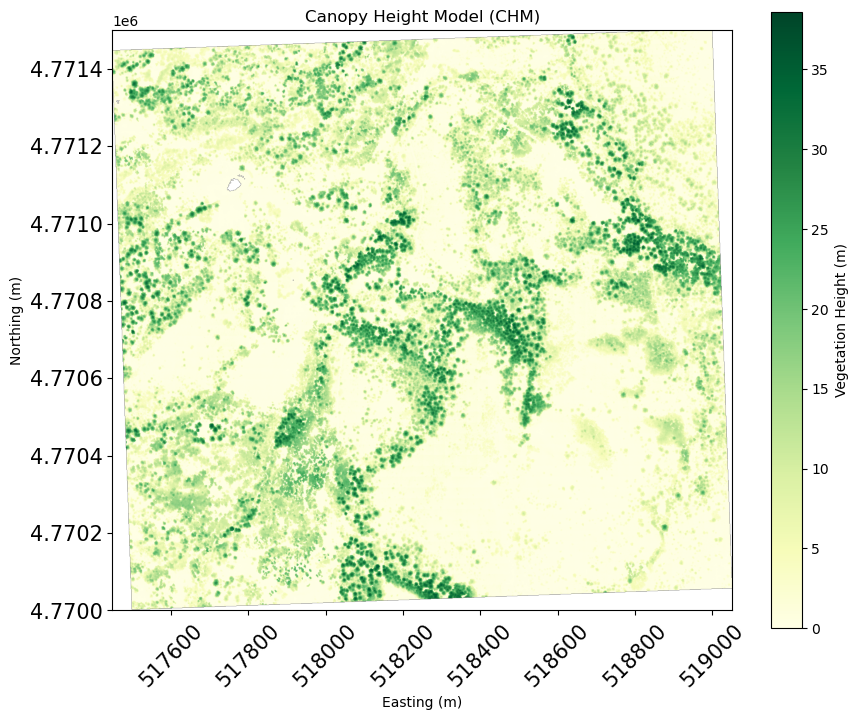

In [30]:
chm_path2 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_epsg6340_3.tif"
with rasterio.open(chm_path2) as src:
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, cmap="YlGn", vmin=0)
    ax.set_title("Canopy Height Model (CHM)")
    ax.tick_params(axis='x', labelsize=15, rotation=45)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    # Add colorbar
    im = ax.get_images()[0]   # grab the image drawn by rasterio
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Vegetation Height (m)")

plt.show()

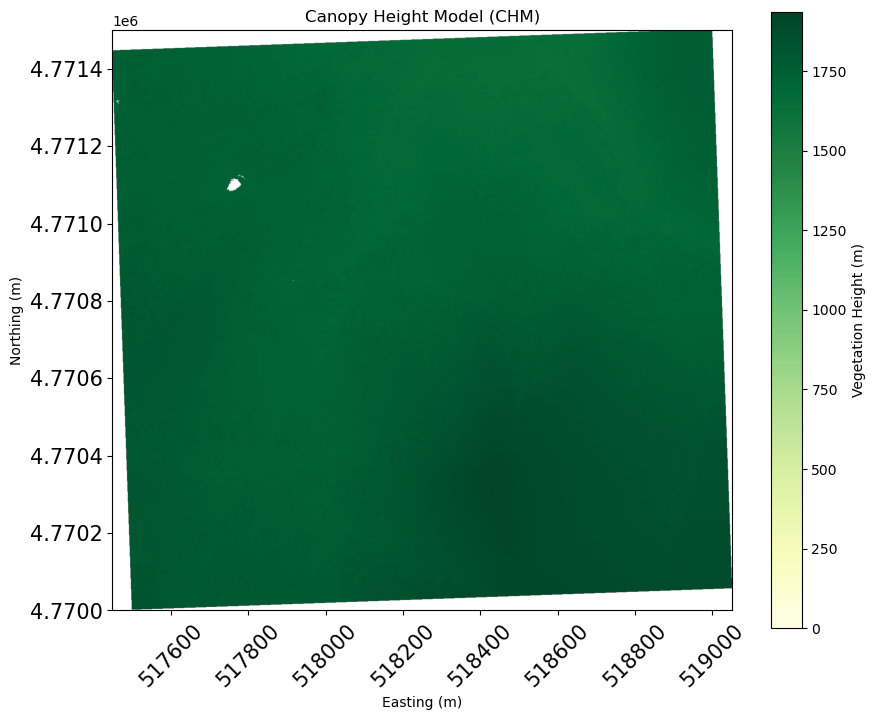

In [10]:
chm_path2 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_over_laz_bbox_epsg6340.tif"
with rasterio.open(chm_path2) as src:
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, cmap="YlGn", vmin=0)
    ax.set_title("Canopy Height Model (CHM)")
    ax.tick_params(axis='x', labelsize=15, rotation=45)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    # Add colorbar
    im = ax.get_images()[0]   # grab the image drawn by rasterio
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Vegetation Height (m)")

plt.show()


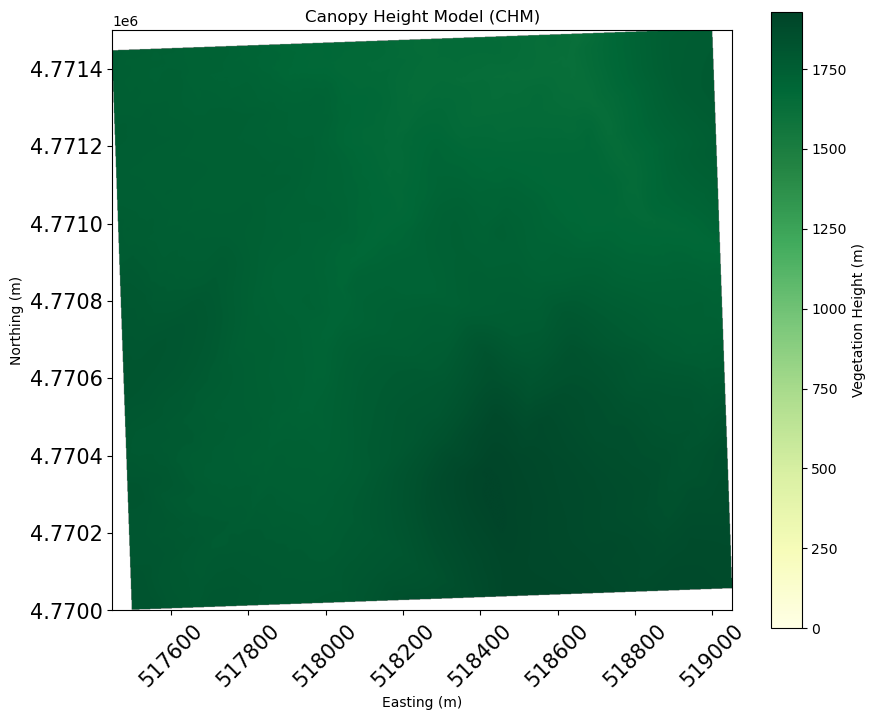

In [11]:
chm_path2 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_over_laz_bbox_epsg6340.tif"
with rasterio.open(chm_path2) as src:
    fig, ax = plt.subplots(figsize=(10, 8))
    show(src, ax=ax, cmap="YlGn", vmin=0)
    ax.set_title("Canopy Height Model (CHM)")
    ax.tick_params(axis='x', labelsize=15, rotation=45)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    # Add colorbar
    im = ax.get_images()[0]   # grab the image drawn by rasterio
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Vegetation Height (m)")

plt.show()


CHM: /bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_3.tif Stats: {'min': 0.0, 'max': 38.7889404296875, 'mean': 5.843379974365234}


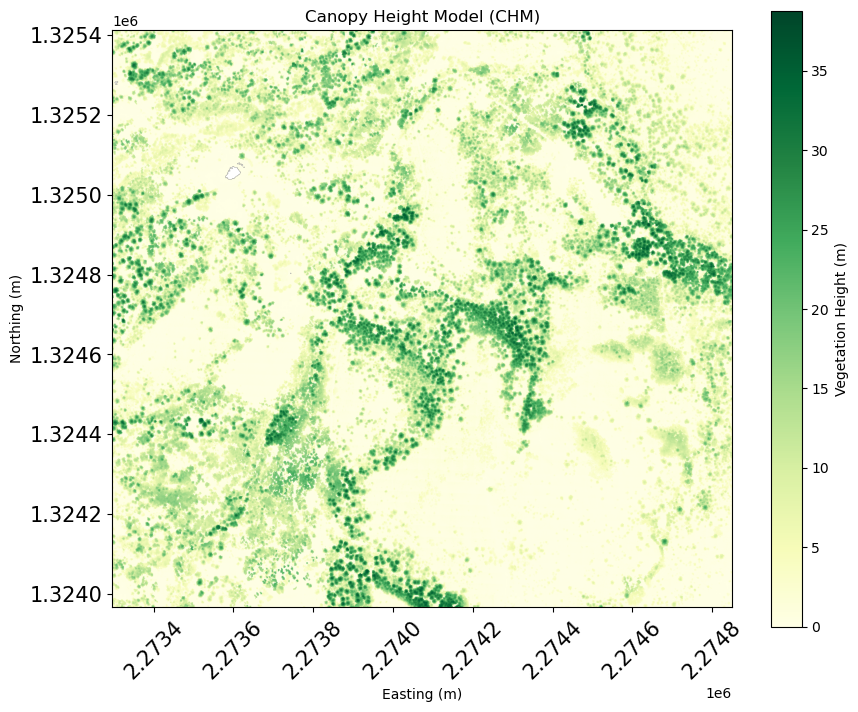

In [31]:
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.windows import from_bounds
from pyproj import Transformer

# --- unchanged ---
def resample_to_target(src_path, target_src, *, resampling=Resampling.bilinear, dst_dtype=np.float32):
    """
    Reproject/resample a raster (src_path) onto the grid/CRS of an already-open
    target rasterio dataset (target_src). Returns the aligned array.
    """
    with rasterio.open(src_path) as s:
        dst = np.empty((target_src.height, target_src.width), dtype=dst_dtype)
        reproject(
            source=rasterio.band(s, 1),
            destination=dst,
            src_transform=s.transform,
            src_crs=s.crs,
            src_nodata=s.nodata,
            dst_transform=target_src.transform,
            dst_crs=target_src.crs,
            dst_nodata=np.nan,
            resampling=resampling,
        )
    return dst

# --- new: use .laz bbox (via your laz_bounds_fallback_with_laspy) ---
def chm_from_dsm_and_dtm_over_laz_bbox(
    laz_path, dsm_path, dtm_path,
    out_chm_path, out_dsm_aligned_path=None, out_dtm_aligned_path=None,
    *, dsm_resampling=Resampling.bilinear, dtm_resampling=Resampling.bilinear,
    laz_epsg_fallback=6340, clip_negative_to_zero=True
):
    """
    Align DSM and DTM to the *DSM grid cropped to the LAZ bounding box*,
    then compute CHM = DSM_aligned - DTM_aligned, and write to GeoTIFF.

    Parameters
    ----------
    laz_path : str
        Path to the .laz point cloud. Its bbox defines the area of interest.
    dsm_path : str
        Path to DSM raster (surface elevations).
    dtm_path : str
        Path to bare-earth DTM raster (ground elevations).
    out_chm_path : str
        Output CHM GeoTIFF path (over LAZ bbox on the DSM grid).
    out_dsm_aligned_path : str, optional
        If given, write the cropped DSM used as the target grid.
    out_dtm_aligned_path : str, optional
        If given, write the DTM resampled onto that cropped DSM grid.
    dsm_resampling, dtm_resampling : Resampling
        Resampling kernels for DSM/DTM (continuous surfaces → bilinear/cubic).
    laz_epsg_fallback : int
        EPSG to assume for the LAZ if none is embedded/known.
    clip_negative_to_zero : bool
        If True, CHM negatives are set to 0.

    Returns
    -------
    dict with paths and basic stats.
    """
    # 1) Get LAZ bbox (native) and its EPSG using your fallback function
    laz_bounds_native, laz_epsg = laz_bounds_fallback_with_laspy(laz_path, epsg=laz_epsg_fallback)
    if laz_epsg is None:
        laz_epsg = laz_epsg_fallback

    # 2) Open DSM to build a crop window from LAZ bbox (reprojected to DSM CRS)
    with rasterio.open(dsm_path) as dsm_src:
        dsm_crs = dsm_src.crs
        tfm = Transformer.from_crs(f"EPSG:{int(laz_epsg)}", dsm_crs, always_xy=True)
        (lx0, ly0) = tfm.transform(laz_bounds_native[0], laz_bounds_native[1])
        (lx1, ly1) = tfm.transform(laz_bounds_native[2], laz_bounds_native[3])
        
        # (lx0, ly0) = (laz_bounds_native[0], laz_bounds_native[1])
        # (lx1, ly1) = (laz_bounds_native[2], laz_bounds_native[3])
        
        # ensure proper ordering
        xmin, xmax = min(lx0, lx1), max(lx0, lx1)
        ymin, ymax = min(ly0, ly1), max(ly0, ly1)

        # intersect with DSM extent
        db = dsm_src.bounds
        xmin = max(xmin, db.left)
        ymin = max(ymin, db.bottom)
        xmax = min(xmax, db.right)
        ymax = min(ymax, db.top)
        if not (xmin < xmax and ymin < ymax):
            raise ValueError("LAZ bbox does not intersect DSM extent in DSM CRS.")

        win = from_bounds(xmin, ymin, xmax, ymax, transform=dsm_src.transform).round_offsets().round_lengths()

        # Read cropped DSM -> defines target grid
        dsm_crop = dsm_src.read(1, window=win, masked=True).astype(np.float32)
        target_transform = dsm_src.window_transform(win)
        target_crs = dsm_src.crs
        target_height, target_width = dsm_crop.shape

        target_profile = dsm_src.profile.copy()
        target_profile.update(
            width=target_width, height=target_height,
            transform=target_transform, crs=target_crs,
            count=1, dtype=rasterio.float32, nodata=np.nan
        )

    # 3) Resample DTM onto the cropped DSM grid
    dtm_aligned = resample_to_target(dtm_path, target_src=rasterio.io.MemoryFile().open(**target_profile),
                                     resampling=dtm_resampling, dst_dtype=np.float32)
    # NOTE: we used an in-memory dataset only for its grid/projection definition.

    # 4) (Optional) resample DSM to its own grid (normally unnecessary, but keeps symmetry)
    #     Here we just use the cropped DSM array we already read:
    dsm_aligned = dsm_crop.filled(np.nan).astype(np.float32)

    # 5) Compute CHM
    dsm_ma = np.ma.masked_invalid(dsm_aligned)
    dtm_ma = np.ma.masked_invalid(dtm_aligned)
    chm = (dsm_ma - dtm_ma).filled(np.nan).astype(np.float32)
    if clip_negative_to_zero:
        chm = np.where(np.isfinite(chm), np.maximum(chm, 0.0), np.nan).astype(np.float32)

    # 6) Write outputs
    if out_dsm_aligned_path:
        with rasterio.open(out_dsm_aligned_path, "w", **target_profile) as dst:
            dst.write(dsm_aligned, 1)

    if out_dtm_aligned_path:
        with rasterio.open(out_dtm_aligned_path, "w", **target_profile) as dst:
            dst.write(dtm_aligned, 1)

    with rasterio.open(out_chm_path, "w", **target_profile) as dst:
        dst.write(chm, 1)

    # 7) Stats
    finite = np.isfinite(chm)
    stats = {}
    if finite.any():
        stats = {
            "min": float(chm[finite].min()),
            "max": float(chm[finite].max()),
            "mean": float(chm[finite].mean()),
        }

    return {
        "chm_path": out_chm_path,
        "dsm_aligned_path": out_dsm_aligned_path,
        "dtm_aligned_path": out_dtm_aligned_path,
        "stats": stats,
    }

if __name__ == "__main__":
    # ---- usage ----
    laz_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar/test_laz/USGS_LPC_ID_SouthernID_2018_D19_11TNH175700.laz"
    be_tif_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/extracted_data/SouthernIdaho2018_21_be_02.tif"
    dsm_path = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM/SouthernIdaho2018_21_DSM.tif"
    out_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_on_highest_hit_bbox.tif"
    out_dsm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DSM_over_laz_bbox.tif"
    out_dtm_aligned_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/DTM_over_laz_bbox.tif"
    out_chm_path="/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_3.tif"
    
    res = chm_from_dsm_and_dtm_over_laz_bbox(
    laz_path=laz_path,
    dsm_path=dsm_path,
    dtm_path=be_tif_path,
    out_chm_path=out_chm_path,
    out_dsm_aligned_path=out_dsm_aligned_path,
    out_dtm_aligned_path=out_dtm_aligned_path,
    dsm_resampling=Resampling.bilinear,
    dtm_resampling=Resampling.bilinear,
    laz_epsg_fallback=6340,  # if your LAZ has no embedded CRS
    )
    print("CHM:", res["chm_path"], "Stats:", res["stats"])
    
    chm_path2 = "/bsuhome/tnde/scratch/carbon_estimation/airborne_lidar_processed/CHM_over_laz_bbox_3.tif"
    with rasterio.open(chm_path2) as src:
        fig, ax = plt.subplots(figsize=(10, 8))
        show(src, ax=ax, cmap="YlGn", vmin=0)
        ax.set_title("Canopy Height Model (CHM)")
        ax.tick_params(axis='x', labelsize=15, rotation=45)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_xlabel("Easting (m)")
        ax.set_ylabel("Northing (m)")

        # Add colorbar
        im = ax.get_images()[0]   # grab the image drawn by rasterio
        cbar = fig.colorbar(im, ax=ax)
        cbar.set_label("Vegetation Height (m)")

    plt.show()
